Prophet Predictions on different time periods.

In [135]:
import pandas as pd
from prophet import Prophet
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.seasonal import STL

f2021 = "../IT-NO_2021_hourly.csv"
f2022 = "../IT-NO_2022_hourly.csv"
f2023 = "../IT-NO_2023_hourly.csv"

dataset1 = pd.read_csv(f2021)
dataset2 = pd.read_csv(f2022)
dataset3 = pd.read_csv(f2023)

## **Carbon Intensity**

In [136]:
# Data concatenation of carbon intensity:
dataset_CI = pd.concat([dataset1, dataset2, dataset3], axis=0)

dataset_CI['Datetime (UTC)'] = pd.to_datetime(dataset_CI['Datetime (UTC)'])
dataset_CI.rename(columns={'Datetime (UTC)': 'timestamp'}, inplace=True) # Column renaming
dataset_CI.set_index('timestamp', inplace=True)

dataset_CI.drop(columns=['Country', 'Zone Name', 'Zone Id', 'Data Source', 'Data Estimated', 'Data Estimation Method', 'Low Carbon Percentage', 'Renewable Percentage'], inplace=True)
dataset_CI['LCA+direct'] = dataset_CI['Carbon Intensity gCO₂eq/kWh (LCA)'] + dataset_CI['Carbon Intensity gCO₂eq/kWh (direct)']
dataset_CI

,Carbon Intensity gCO₂eq/kWh (direct),Carbon Intensity gCO₂eq/kWh (LCA),LCA+direct
timestamp,,,
2021-01-01 00:00:00,303.29,389.74,693.03
2021-01-01 01:00:00,303.45,387.76,691.21
2021-01-01 02:00:00,295.04,377.86,672.90
2021-01-01 03:00:00,295.56,380.36,675.92
2021-01-01 04:00:00,308.06,394.66,702.72
...,...,...,...
2023-12-31 19:00:00,260.51,333.72,594.23
2023-12-31 20:00:00,265.88,342.93,608.81
2023-12-31 21:00:00,250.60,324.02,574.62


In [137]:
dataset_CI.drop(columns=['Carbon Intensity gCO₂eq/kWh (direct)', 'Carbon Intensity gCO₂eq/kWh (LCA)'], inplace=True)
dataset_CI

,LCA+direct
timestamp,
2021-01-01 00:00:00,693.03
2021-01-01 01:00:00,691.21
2021-01-01 02:00:00,672.90
2021-01-01 03:00:00,675.92
2021-01-01 04:00:00,702.72
...,...
2023-12-31 19:00:00,594.23
2023-12-31 20:00:00,608.81
2023-12-31 21:00:00,574.62


In [138]:
dataset_CI_fix = dataset_CI.reset_index()
dataset_CI_fix

,timestamp,LCA+direct
0,2021-01-01 00:00:00,693.03
1,2021-01-01 01:00:00,691.21
2,2021-01-01 02:00:00,672.90
3,2021-01-01 03:00:00,675.92
4,2021-01-01 04:00:00,702.72
...,...,...
26275,2023-12-31 19:00:00,594.23
26276,2023-12-31 20:00:00,608.81
26277,2023-12-31 21:00:00,574.62
26278,2023-12-31 22:00:00,597.98


In [139]:
dataset_CI_fix.rename(columns={'timestamp':'ds', 'LCA+direct':'y' }, inplace=True)
dataset_CI_fix

,ds,y
0,2021-01-01 00:00:00,693.03
1,2021-01-01 01:00:00,691.21
2,2021-01-01 02:00:00,672.90
3,2021-01-01 03:00:00,675.92
4,2021-01-01 04:00:00,702.72
...,...,...
26275,2023-12-31 19:00:00,594.23
26276,2023-12-31 20:00:00,608.81
26277,2023-12-31 21:00:00,574.62
26278,2023-12-31 22:00:00,597.98


In [140]:
dataset_half = dataset_CI_fix[(dataset_CI_fix['ds'] < '2023-01')]
dataset_half

,ds,y
0,2021-01-01 00:00:00,693.03
1,2021-01-01 01:00:00,691.21
2,2021-01-01 02:00:00,672.90
3,2021-01-01 03:00:00,675.92
4,2021-01-01 04:00:00,702.72
...,...,...
17515,2022-12-31 19:00:00,743.33
17516,2022-12-31 20:00:00,733.81
17517,2022-12-31 21:00:00,742.13
17518,2022-12-31 22:00:00,739.83


<font color='red'></color>**Carbon Intensity Predictions**

10:33:26 - cmdstanpy - INFO - Chain [1] start processing
10:33:56 - cmdstanpy - INFO - Chain [1] done processing


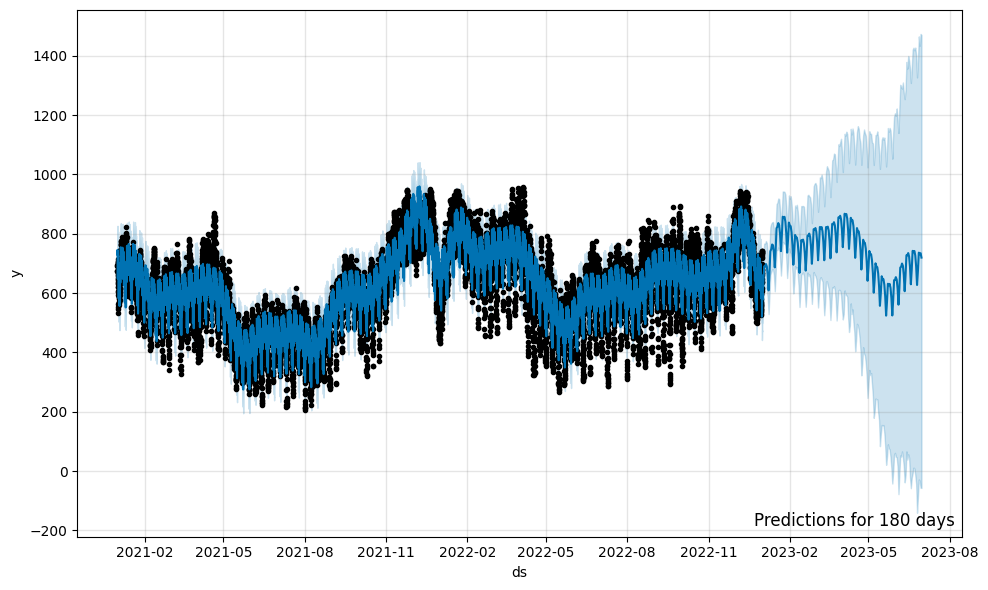

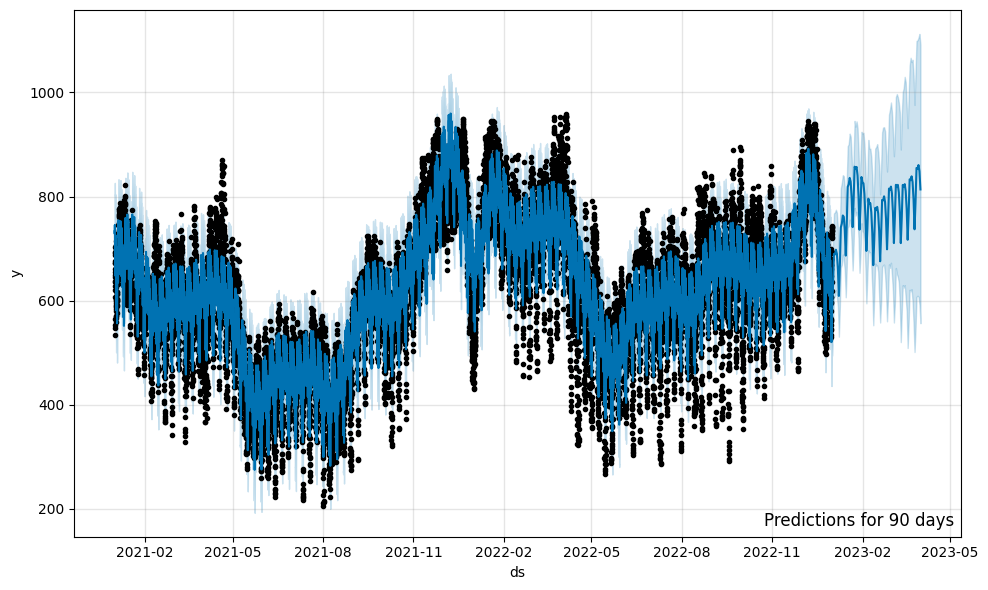

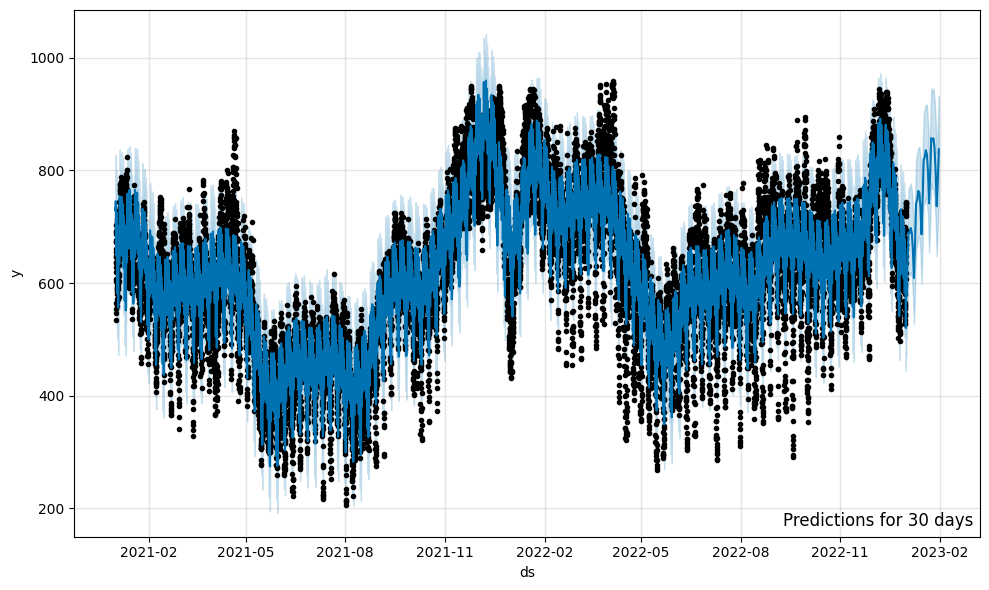

In [141]:
# Create and fit Prophet model
m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
m.fit(dataset_half)

# Define periods 
periods_list = [180,90,30]

# Loop over periods to generate predictions and plot forecasts
for periods in periods_list:
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Plot forecast
    fig = m.plot(forecast)
    
    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {periods} days', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
   
    # Show the plot
    plt.show()

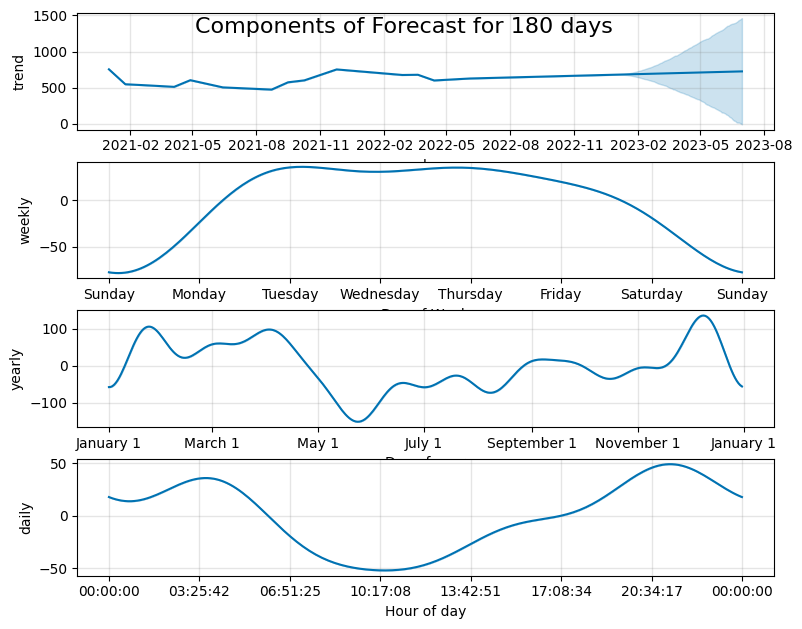

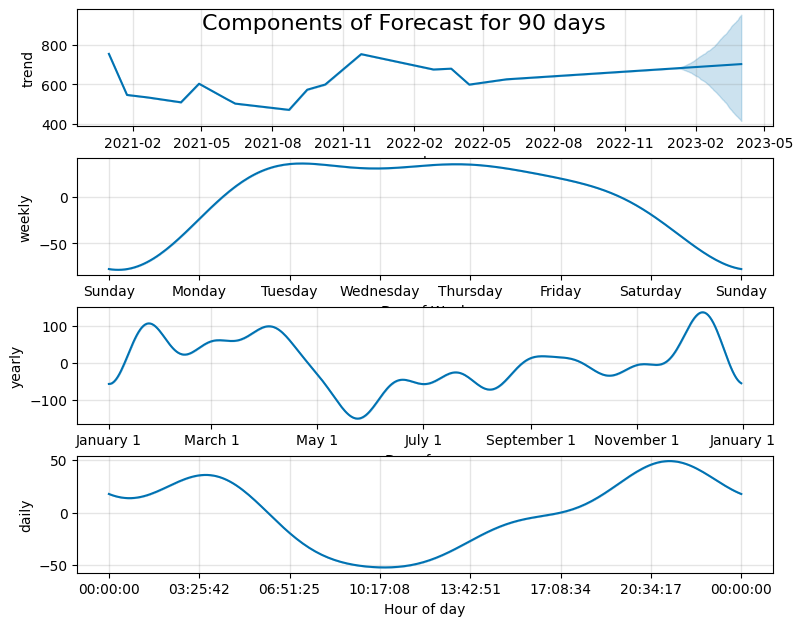

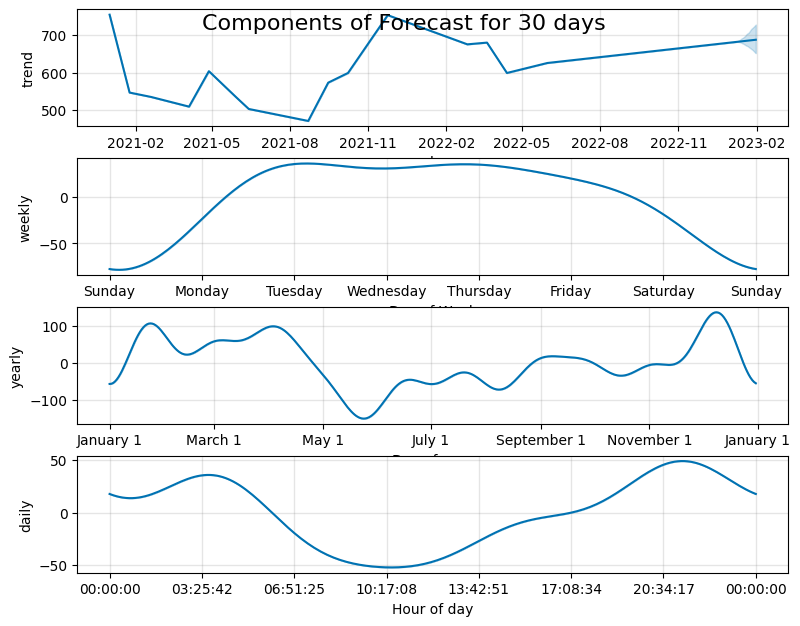

In [142]:
for periods in periods_list:
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Plot components of the forecast
    fig = m.plot_components(forecast)
    
    # Add label to specify the period being predicted
    plt.suptitle(f'Components of Forecast for {periods} days', fontsize=16)
    
    # Resize the figure
    fig.set_size_inches(8, 6)
    
    # Save the plot as an image
    plt.savefig(f'../PLOTS/CI_prophet{periods}days.png', dpi=300)
    
    # Show the plot
    plt.show()

comparison with real data

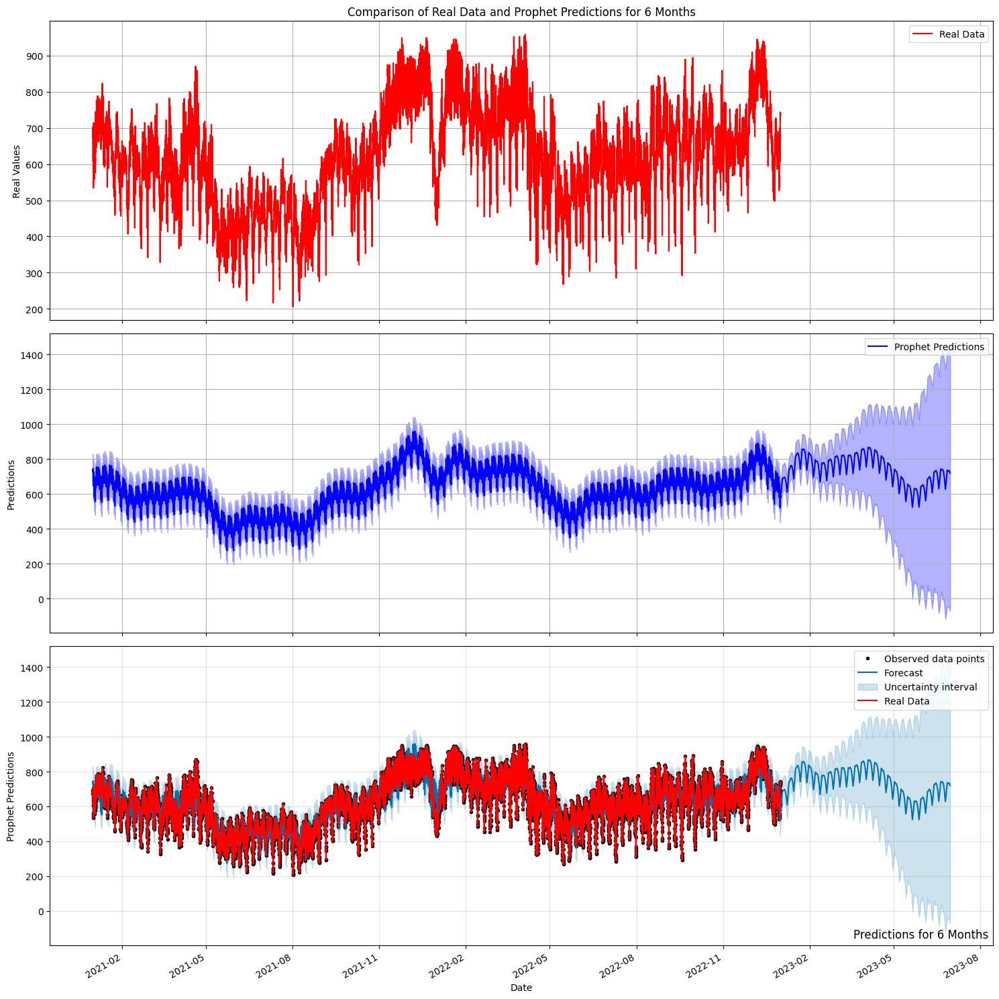

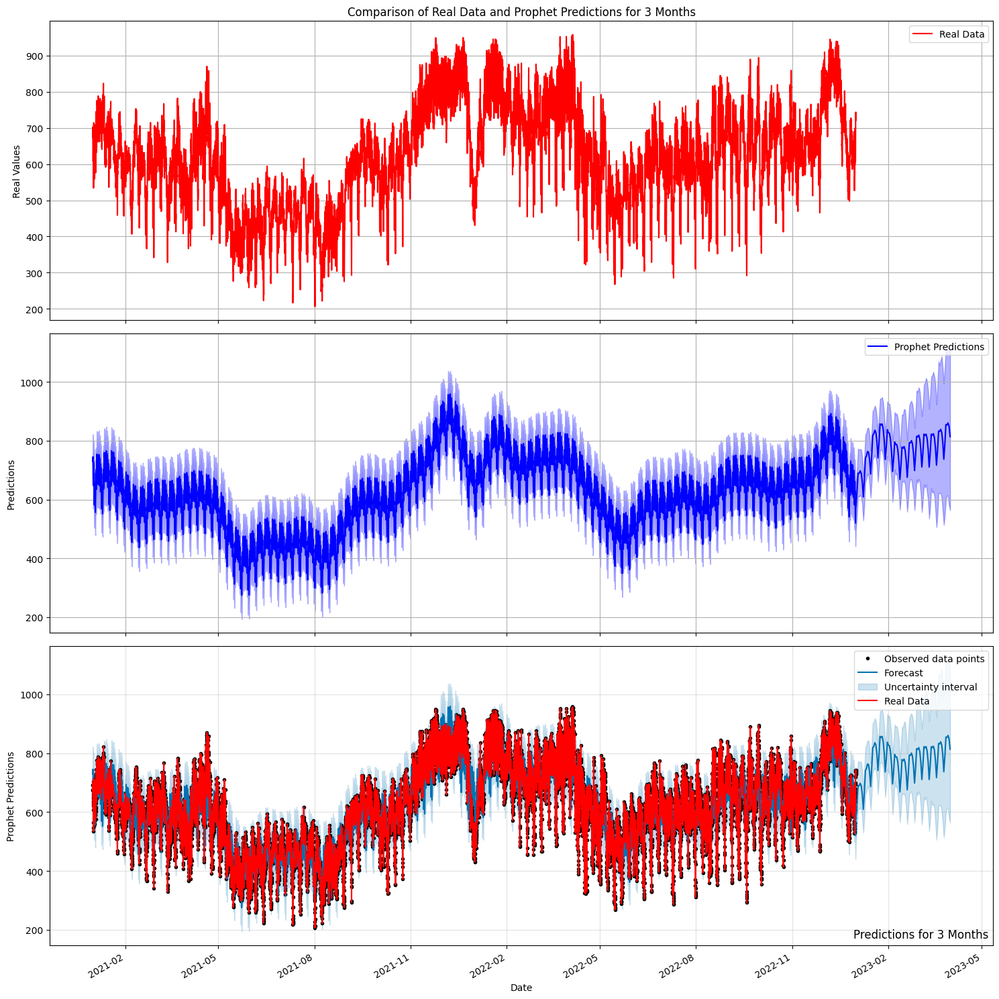

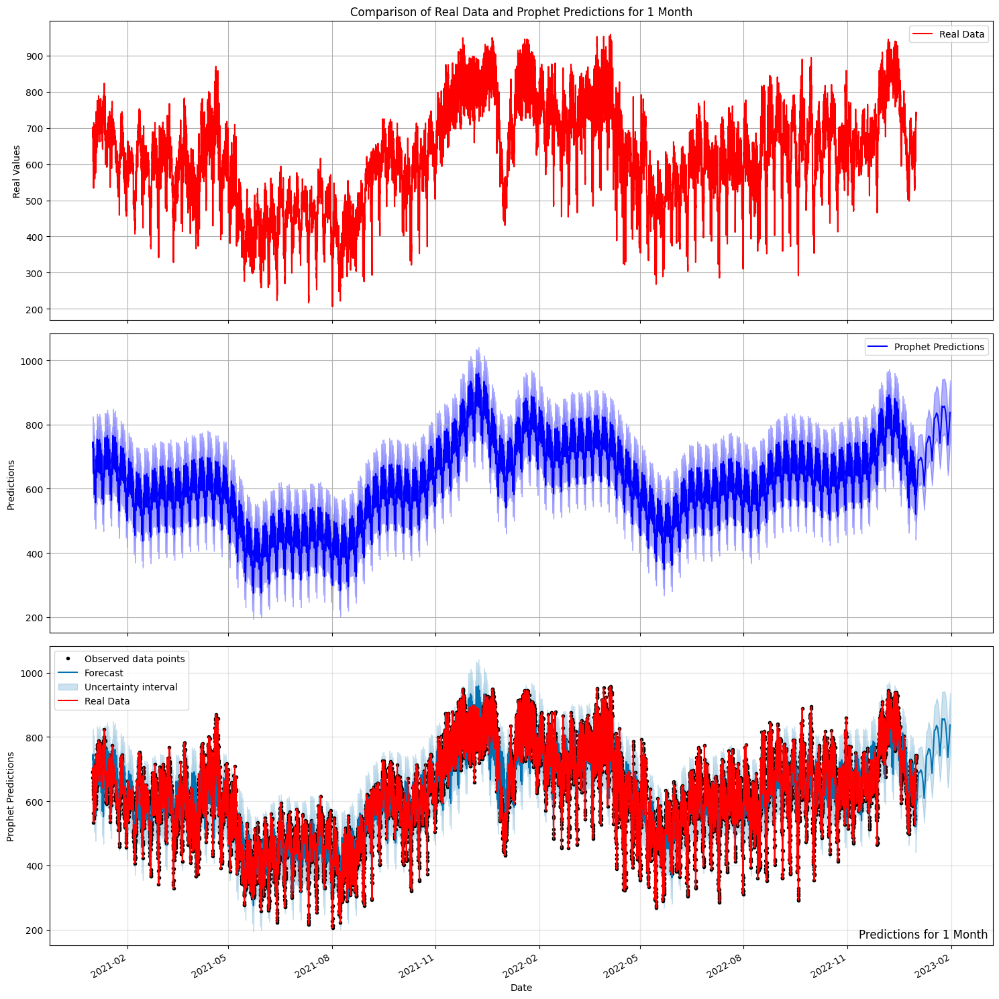

In [143]:
# Datapoints for the real dataset
x1 = dataset_half['ds']
y1 = dataset_half['y']


periods_list = [180, 90, 30]
periods_labels = ['6 Months', '3 Months', '1 Month']

# Loop over periods to generate predictions and plot forecasts
for periods, label in zip(periods_list, periods_labels):
    
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Create the figure and subplots
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

    # Plot real data in the first subplot
    ax1.plot(x1, y1, 'r-', label='Real Data')
    ax1.legend()
    ax1.grid()
    ax1.set_title(f'Comparison of Real Data and Prophet Predictions for {label}')
    ax1.set_ylabel('Real Values')
    ax1.set_xlabel('Date')  
    ax1.tick_params(axis='x', rotation=45)  

    # Plot Prophet predictions in the second subplot
    ax2.plot(x2, y2, 'b-', label='Prophet Predictions')
    ax2.fill_between(x2, forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.3)
    ax2.legend()
    ax2.grid()
    ax2.set_ylabel('Predictions')
    ax2.set_xlabel('Date')  
    ax2.tick_params(axis='x', rotation=45)  

    # Plot Prophet's forecast plot in the third subplot
    fig1 = m.plot(forecast, ax=ax3)  # Plot the forecast on the third subplot
    ax3.plot(x1, y1, 'r-', label='Real Data')  # Plot real data on the third subplot
    ax3.legend()
    ax3.set_xlabel('Date')
    ax3.set_ylabel('Prophet Predictions')
    ax3.tick_params(axis='x', rotation=45)  

    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {label}', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
    
    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

Mean Absolute Percentage Error for 6 Months: 19.69%
Mean Absolute Percentage Error for 3 Months: 23.28%
Mean Absolute Percentage Error for 1 Month: 13.42%


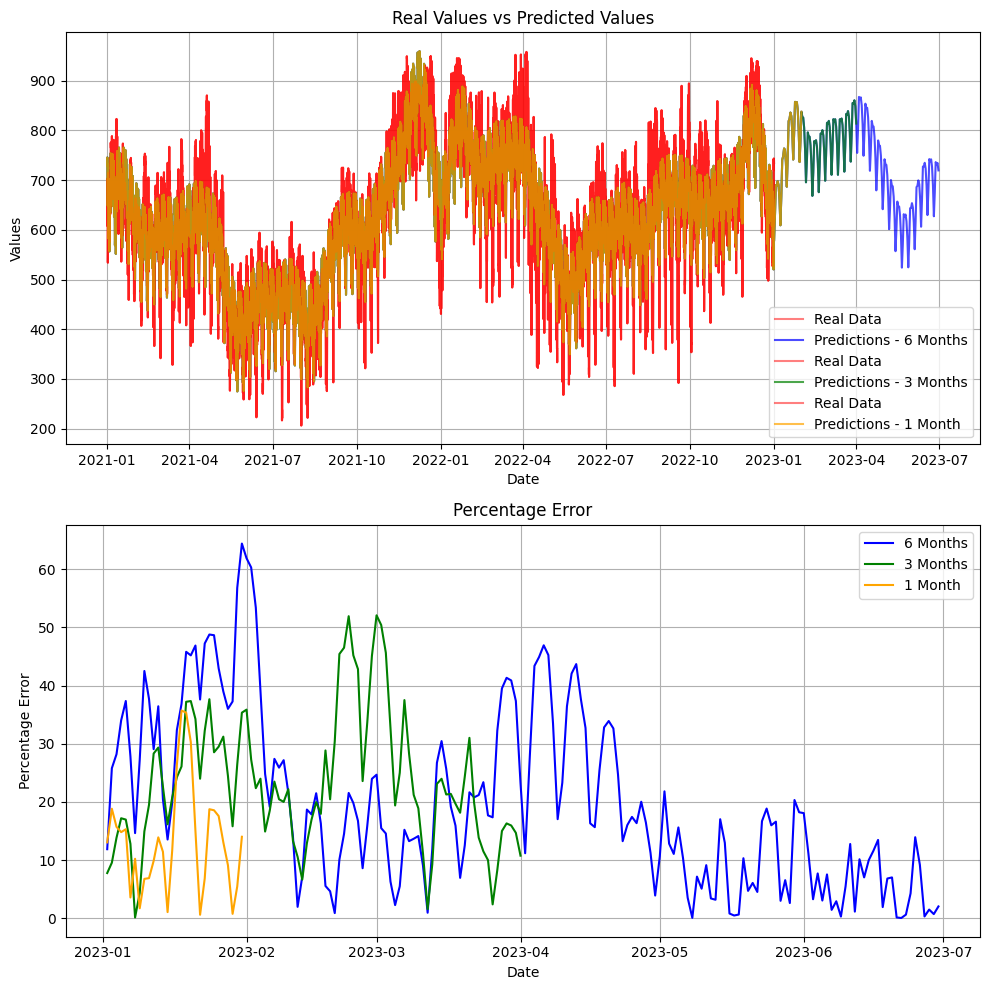

In [144]:
# Initialize subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Define colors for each period
colors = ['blue', 'green', 'orange']

# Loop over periods to generate predictions and plot forecasts
for periods, label, color in zip(periods_list, periods_labels, colors):
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Define data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Compute absolute percentage error
    absolute_percentage_error = abs((dataset_half['y'].tail(periods).values - forecast['yhat'].tail(periods).values) / dataset_half['y'].tail(periods).values) * 100
    
    # Compute mean absolute percentage error
    mean_absolute_percentage_error = absolute_percentage_error.mean()
    
    print(f'Mean Absolute Percentage Error for {label}: {mean_absolute_percentage_error:.2f}%')
    
    # Plot real values vs predicted values in the first subplot
    axs[0].plot(x1, y1, 'r-', label='Real Data', alpha=0.5)
    axs[0].plot(x2, y2, label=f'Predictions - {label}', color=color, alpha=0.7)
    axs[0].set_title('Real Values vs Predicted Values')
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Values')
    axs[0].legend()
    
    # Plot percentage error in the second subplot
    axs[1].plot(x2.tail(periods), absolute_percentage_error, label=label, color=color)
    axs[1].set_title('Percentage Error')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Percentage Error')
    axs[1].legend()

# Add grid lines to both subplots
    axs[0].grid(True)
    axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

  

It is possible to notice that the **lowest Mean Absolute Percentage Error** is achieved on **1 Month predictions**. Let's now perform predictions on smaller periods to see wheather there are optimal performances.

10:35:42 - cmdstanpy - INFO - Chain [1] start processing
10:36:10 - cmdstanpy - INFO - Chain [1] done processing


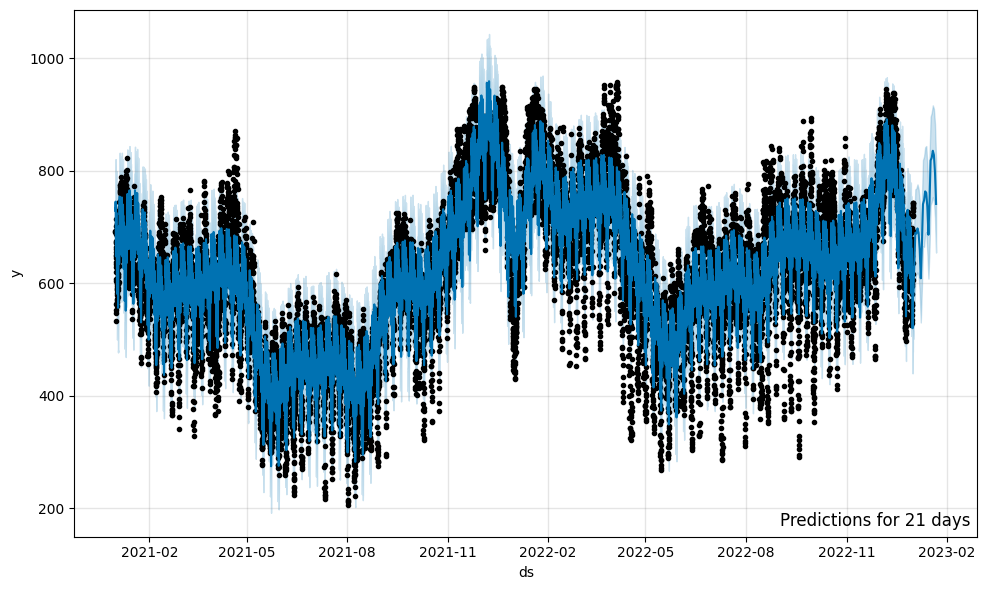

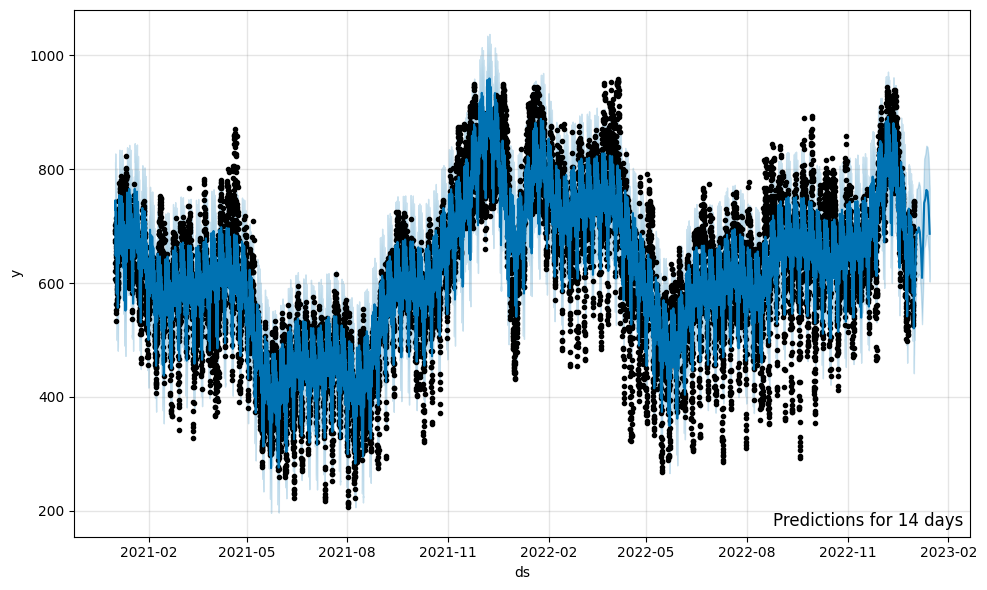

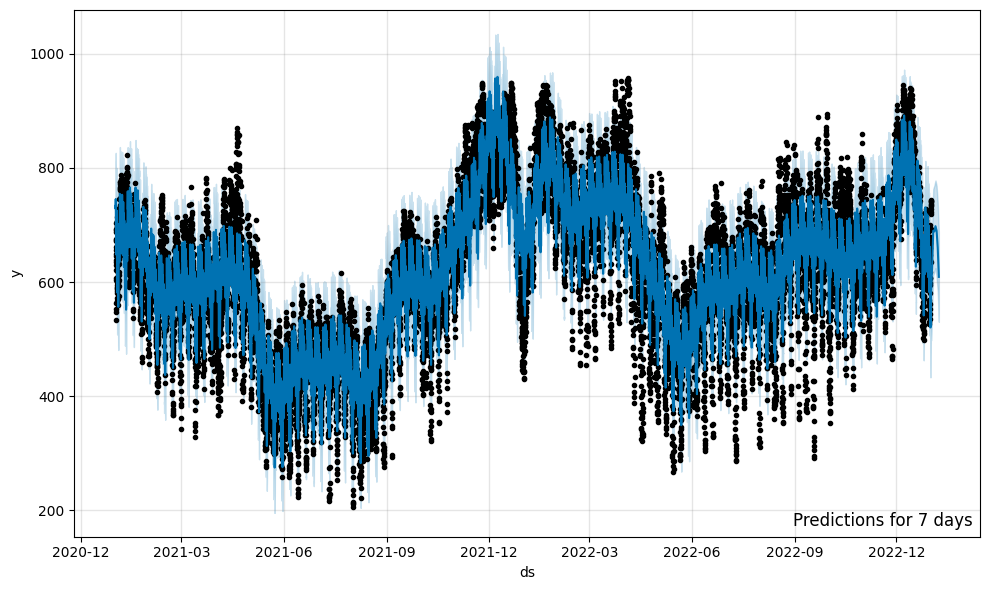

In [145]:
# Create and fit Prophet model
m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
m.fit(dataset_half)

# Define periods
n_periods_list = [21,14,7]

# Loop over periods to generate predictions and plot forecasts
for periods in n_periods_list:
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Plot forecast
    fig = m.plot(forecast)
    
    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {periods} days', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
   
    # Show the plot
    plt.show()

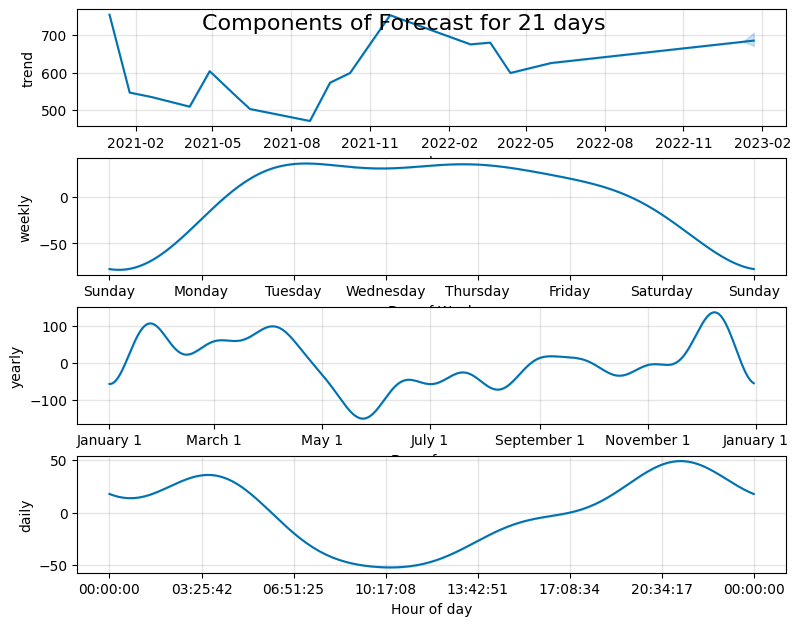

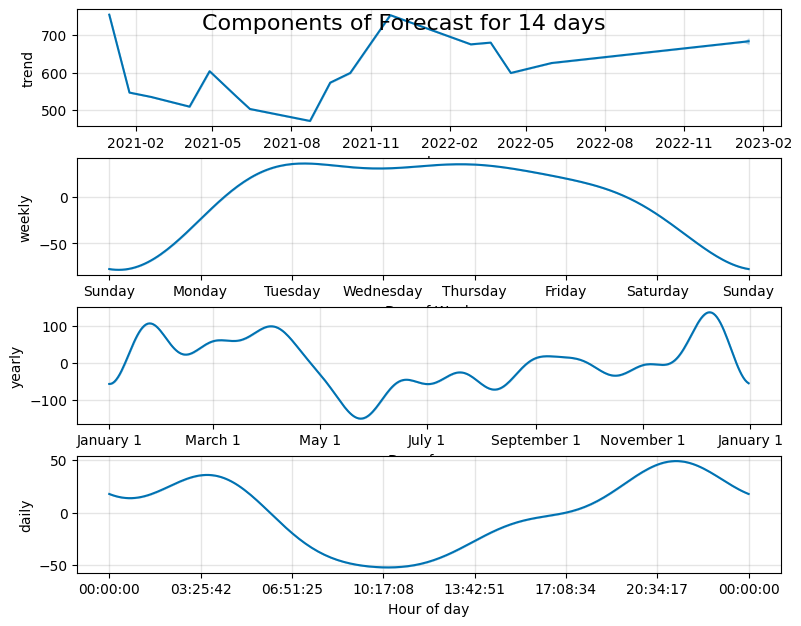

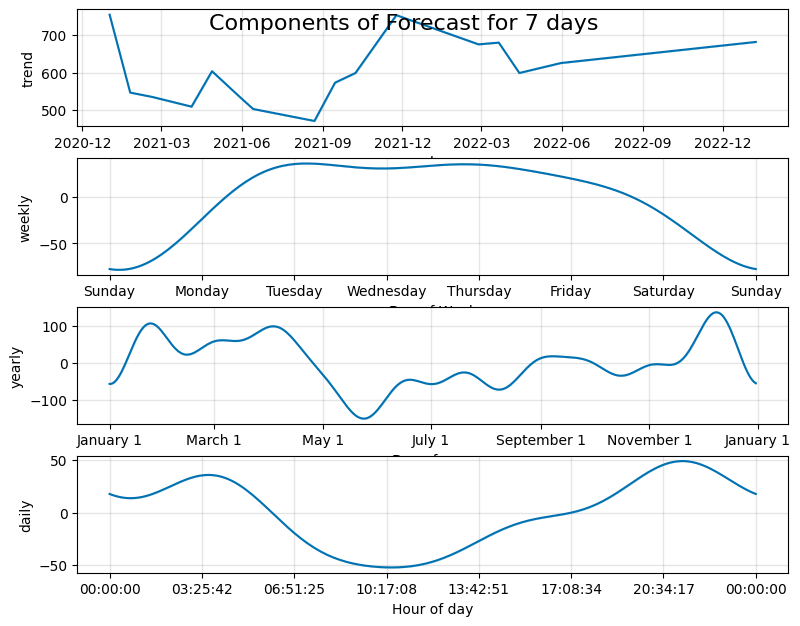

In [146]:
for periods in n_periods_list:
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Plot components of the forecast
    fig = m.plot_components(forecast)
    
    # Add label to specify the period being predicted
    plt.suptitle(f'Components of Forecast for {periods} days', fontsize=16)
    
    # Resize the figure
    fig.set_size_inches(8, 6)
    
    # Save the plot as an image
    plt.savefig(f'../PLOTS/CI_prophet{periods}days.png', dpi=300)
    
    # Show the plot
    plt.show()

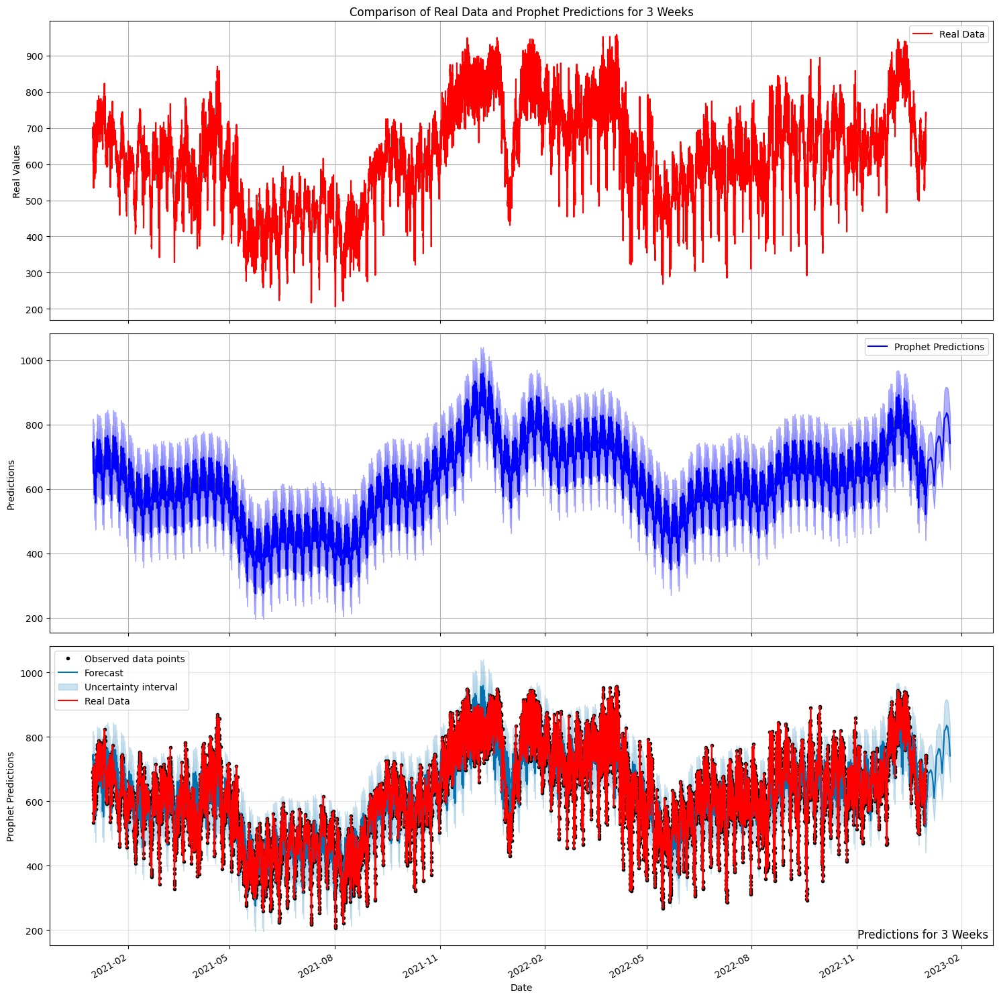

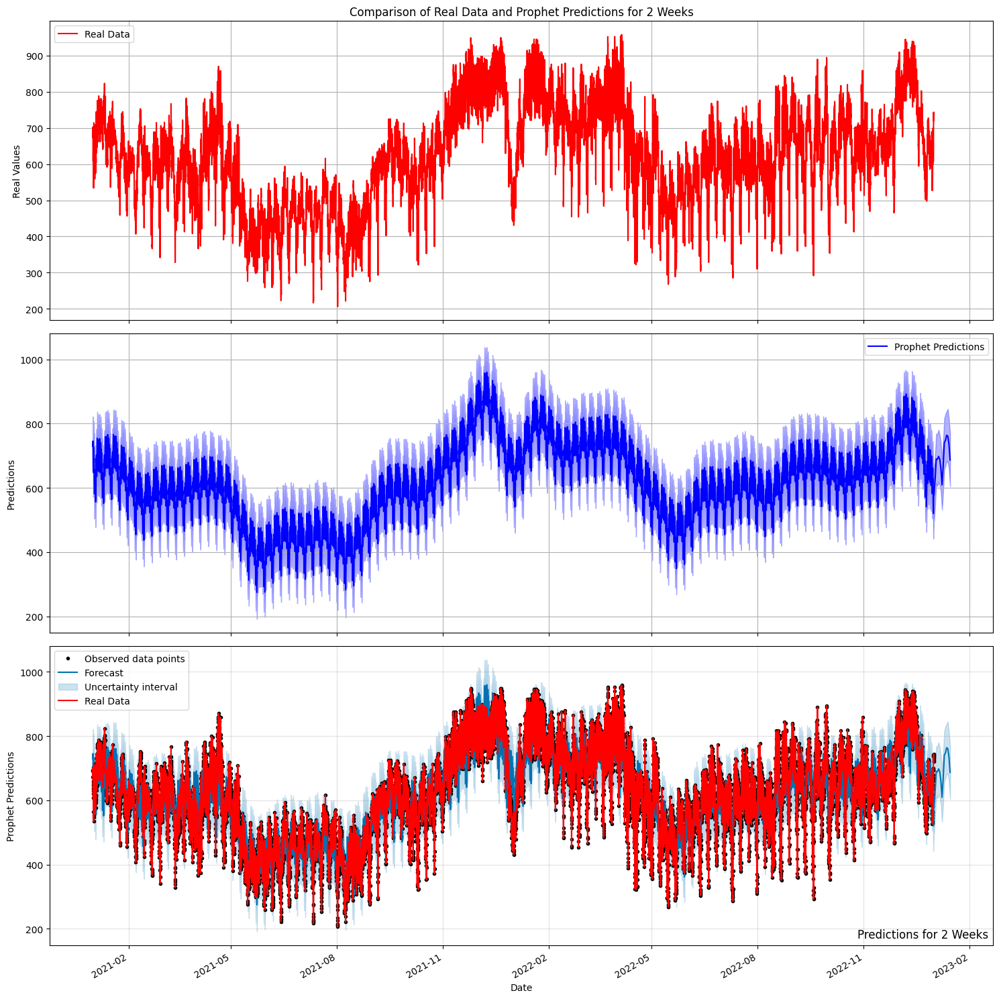

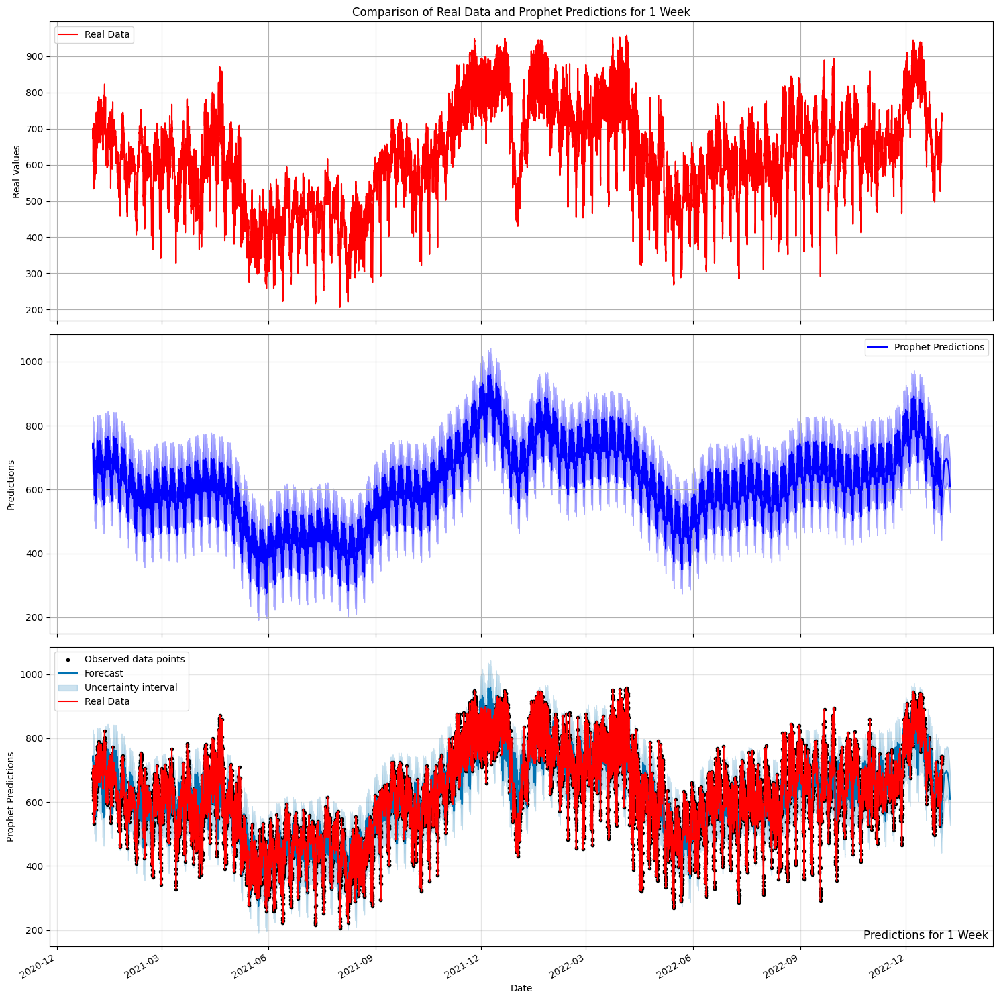

In [147]:
# COMPARISON WITH REAL DATA

# Datapoints for the real dataset
x1 = dataset_half['ds']
y1 = dataset_half['y']


n_periods_list = [21, 14, 7]
n_periods_labels = ['3 Weeks', '2 Weeks', '1 Week']

# Loop over periods to generate predictions and plot forecasts
for periods, label in zip(n_periods_list, n_periods_labels):
    
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Create the figure and subplots
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

    # Plot real data in the first subplot
    ax1.plot(x1, y1, 'r-', label='Real Data')
    ax1.legend()
    ax1.grid()
    ax1.set_title(f'Comparison of Real Data and Prophet Predictions for {label}')
    ax1.set_ylabel('Real Values')
    ax1.set_xlabel('Date')  
    ax1.tick_params(axis='x', rotation=45)  

    # Plot Prophet predictions in the second subplot
    ax2.plot(x2, y2, 'b-', label='Prophet Predictions')
    ax2.fill_between(x2, forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.3)
    ax2.legend()
    ax2.grid()
    ax2.set_ylabel('Predictions')
    ax2.set_xlabel('Date')  
    ax2.tick_params(axis='x', rotation=45)  

    # Plot Prophet's forecast plot in the third subplot
    fig1 = m.plot(forecast, ax=ax3)  # Plot the forecast on the third subplot
    ax3.plot(x1, y1, 'r-', label='Real Data')  # Plot real data on the third subplot
    ax3.legend()
    ax3.set_xlabel('Date')
    ax3.set_ylabel('Prophet Predictions')
    ax3.tick_params(axis='x', rotation=45)  

    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {label}', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
    
    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

mean percentage error computation and plot

Mean Absolute Percentage Error for 3 Weeks: 7.45%
Mean Absolute Percentage Error for 2 Weeks: 5.71%
Mean Absolute Percentage Error for 1 Week: 9.35%


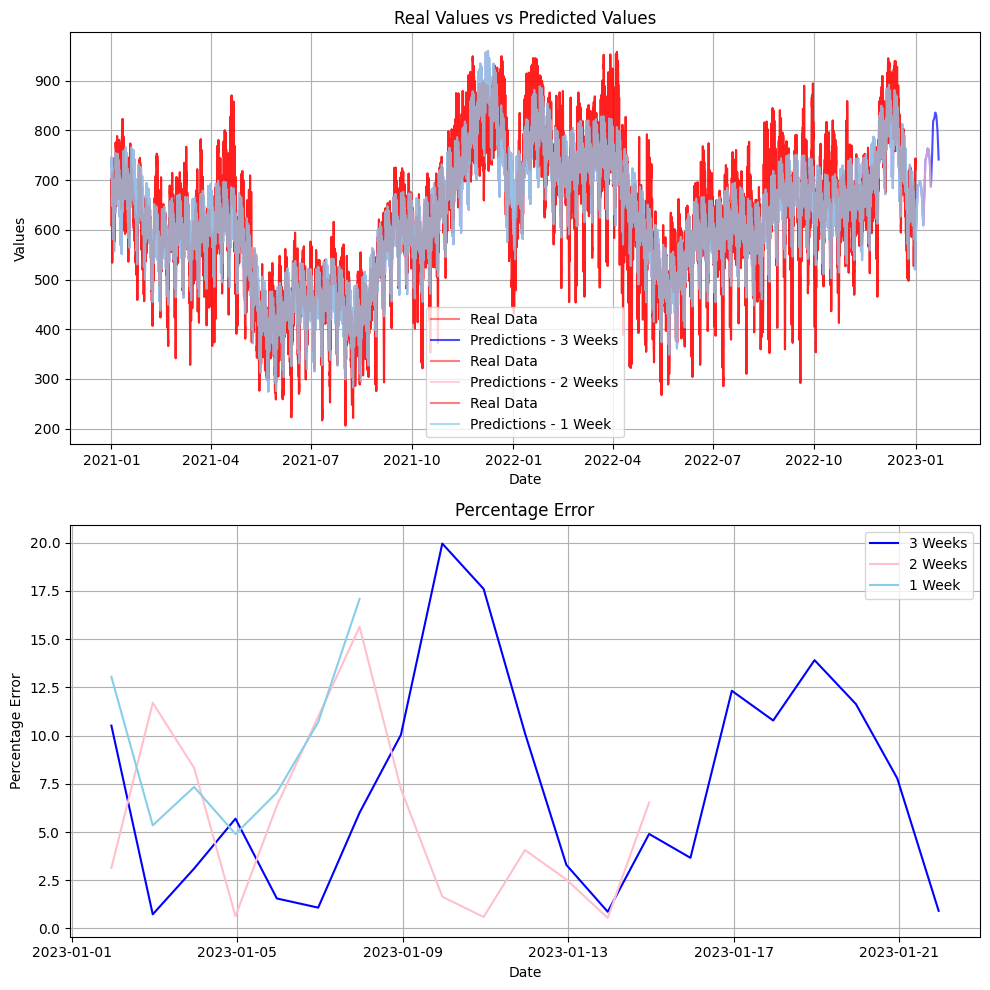

In [148]:
# Initialize subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Define colors for each period
colors = ['blue', 'pink', 'skyblue']

# Loop over periods to generate predictions and plot forecasts
for periods, label, color in zip(n_periods_list, n_periods_labels, colors):
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Define data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Compute absolute percentage error
    absolute_percentage_error = abs((dataset_half['y'].tail(periods).values - forecast['yhat'].tail(periods).values) / dataset_half['y'].tail(periods).values) * 100
    
    # Compute mean absolute percentage error
    mean_absolute_percentage_error = absolute_percentage_error.mean()
    
    print(f'Mean Absolute Percentage Error for {label}: {mean_absolute_percentage_error:.2f}%')
    
    # Plot real values vs predicted values in the first subplot
    axs[0].plot(x1, y1, 'r-', label='Real Data', alpha=0.5)
    axs[0].plot(x2, y2, label=f'Predictions - {label}', color=color, alpha=0.7)
    axs[0].set_title('Real Values vs Predicted Values')
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Values')
    axs[0].legend()
    
    # Plot percentage error in the second subplot
    axs[1].plot(x2.tail(periods), absolute_percentage_error, label=label, color=color)
    axs[1].set_title('Percentage Error')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Percentage Error')
    axs[1].legend()

# Add grid lines to both subplots
    axs[0].grid(True)
    axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

  

The period that gives the lowest Mean Absolute Percentage Error among all the tested ones is **2 Weeks**, with a value of 5.71%.

## **COP**  

In [161]:
# Importing dataset
dataset_Cop = pd.read_csv('../Cop_Dataset.csv', index_col=0, parse_dates=True) 
dataset_Cop = dataset_Cop.sum(axis=1)

dataset_Cop

timestamp
2021-01-01 00:00:00    232459.597015
2021-01-01 01:00:00    240152.898959
2021-01-01 02:00:00    234486.053407
2021-01-01 03:00:00    240409.641951
2021-01-01 04:00:00    252919.407283
                           ...      
2022-09-28 18:00:00    316331.736829
2022-09-28 19:00:00    330324.063853
2022-09-28 20:00:00    340672.915831
2022-09-28 21:00:00    326630.447000
2022-09-28 22:00:00    318677.570400
Length: 15263, dtype: float64

In [162]:
dataset_Cop = dataset_Cop.reset_index()
dataset_Cop.rename(columns={'timestamp':'ds', 0:'y' }, inplace=True)

dataset_Cop

,ds,y
0,2021-01-01 00:00:00,232459.597015
1,2021-01-01 01:00:00,240152.898959
2,2021-01-01 02:00:00,234486.053407
3,2021-01-01 03:00:00,240409.641951
4,2021-01-01 04:00:00,252919.407283
...,...,...
15258,2022-09-28 18:00:00,316331.736829
15259,2022-09-28 19:00:00,330324.063853
15260,2022-09-28 20:00:00,340672.915831
15261,2022-09-28 21:00:00,326630.447000


PREDICTIONS

10:51:15 - cmdstanpy - INFO - Chain [1] start processing
10:51:23 - cmdstanpy - INFO - Chain [1] done processing


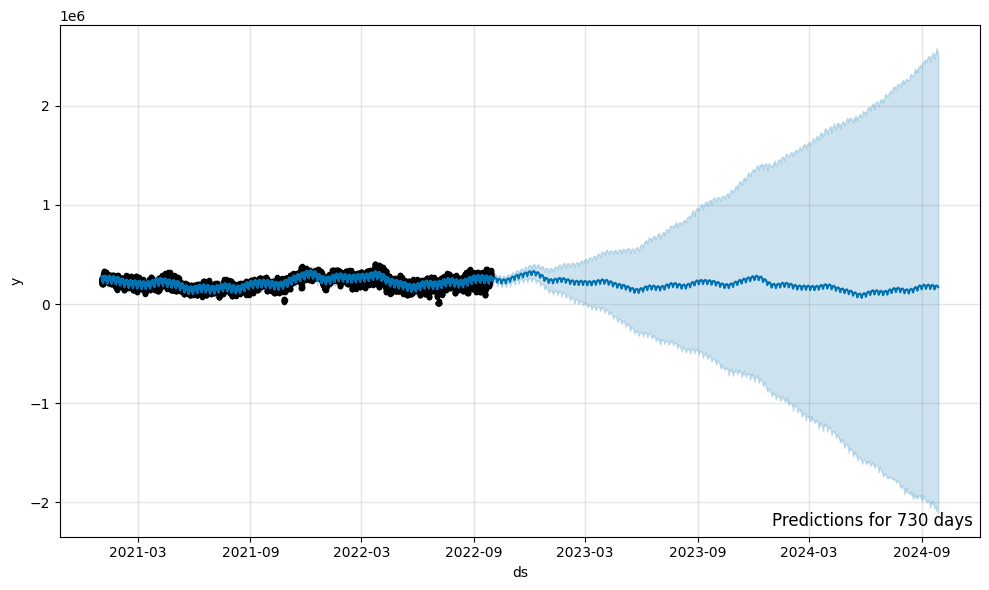

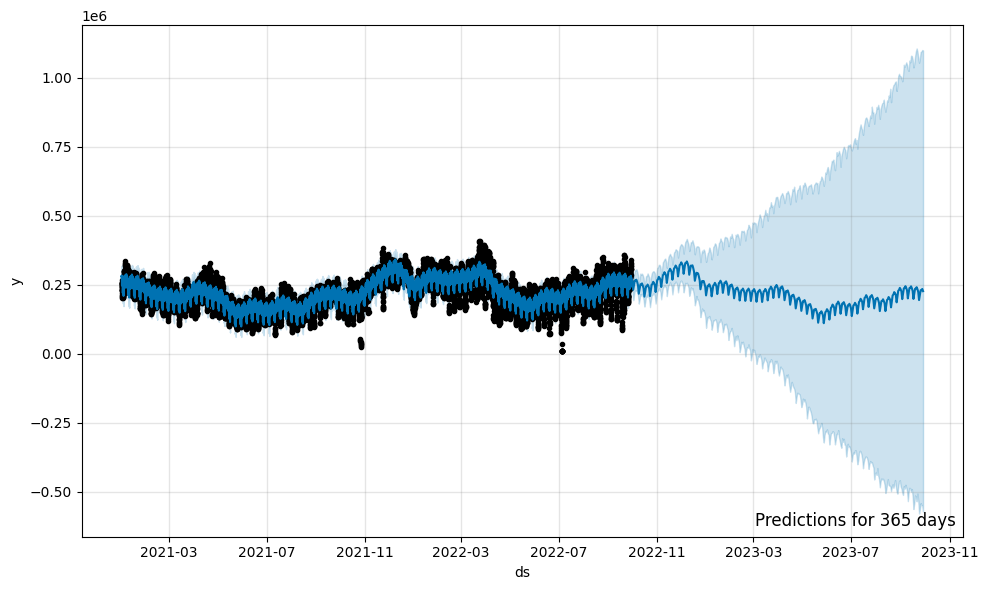

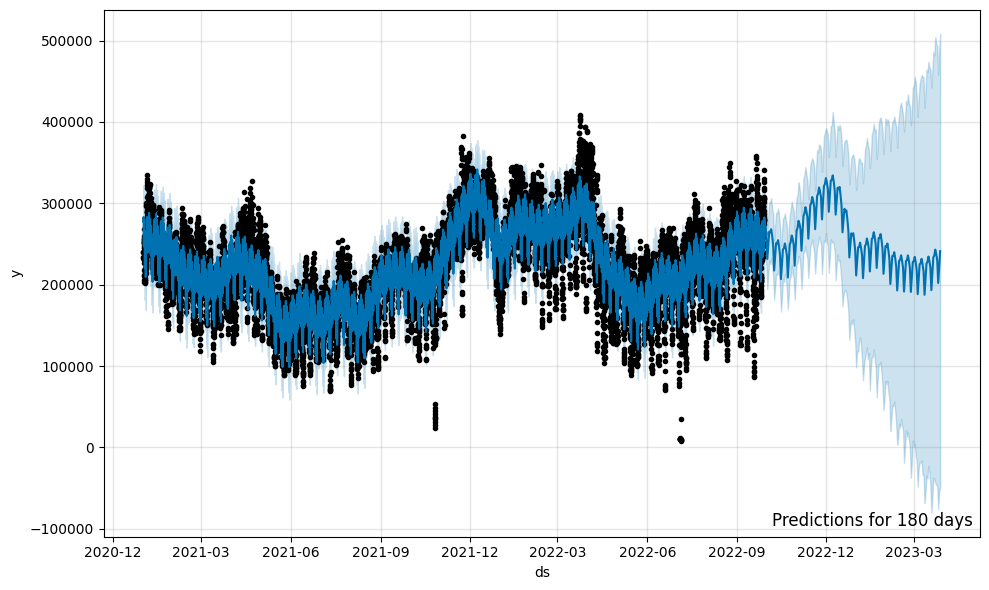

In [163]:
# Create and fit Prophet model
m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
m.fit(dataset_Cop)

# Define periods
periods_list = [730,365,180]

# Loop over periods to generate predictions and plot forecasts
for periods in periods_list:
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Plot forecast
    fig = m.plot(forecast)
    
    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {periods} days', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
   
    # Show the plot
    plt.show()

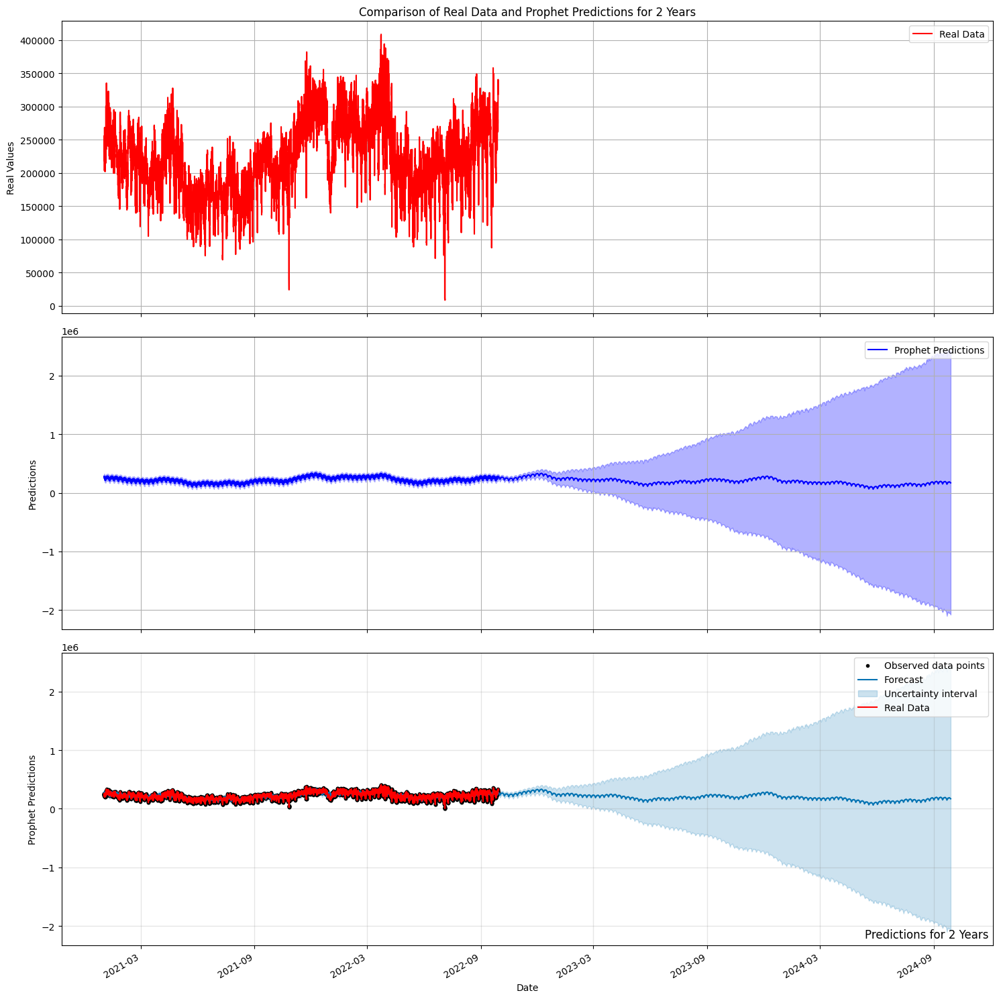

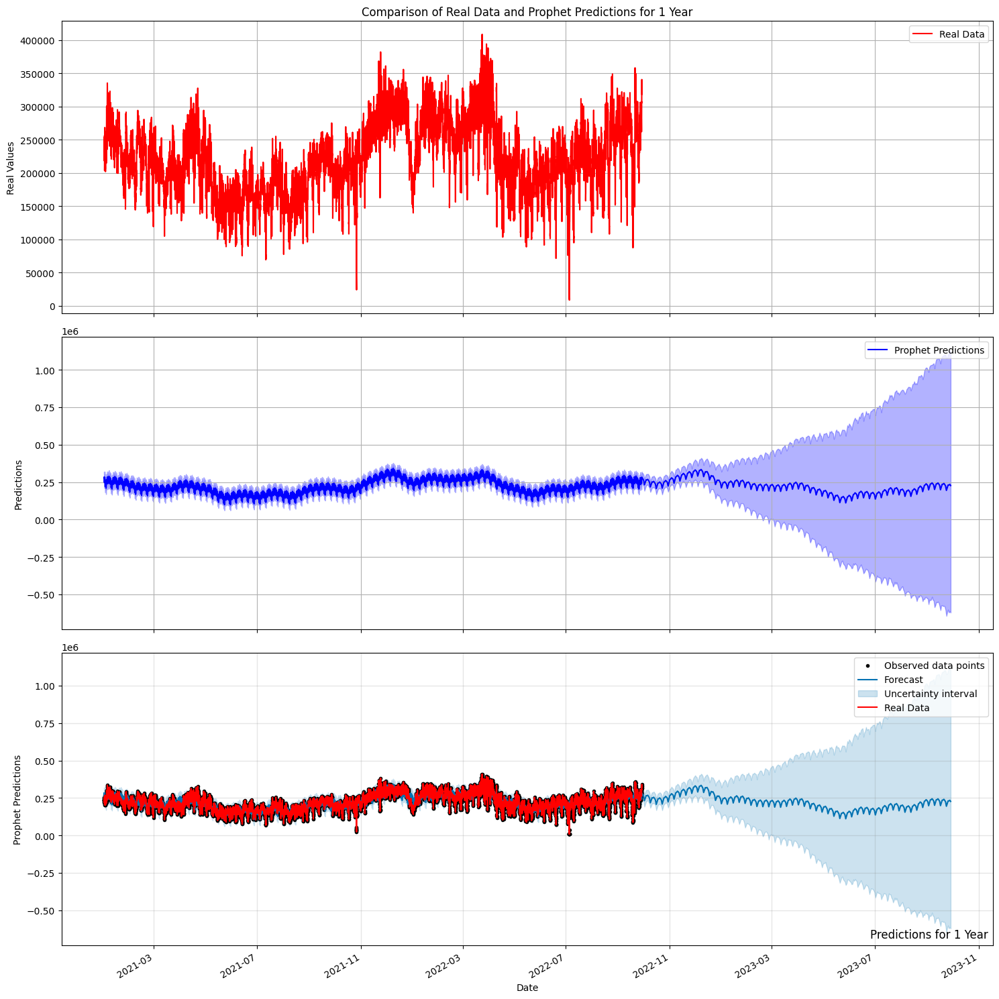

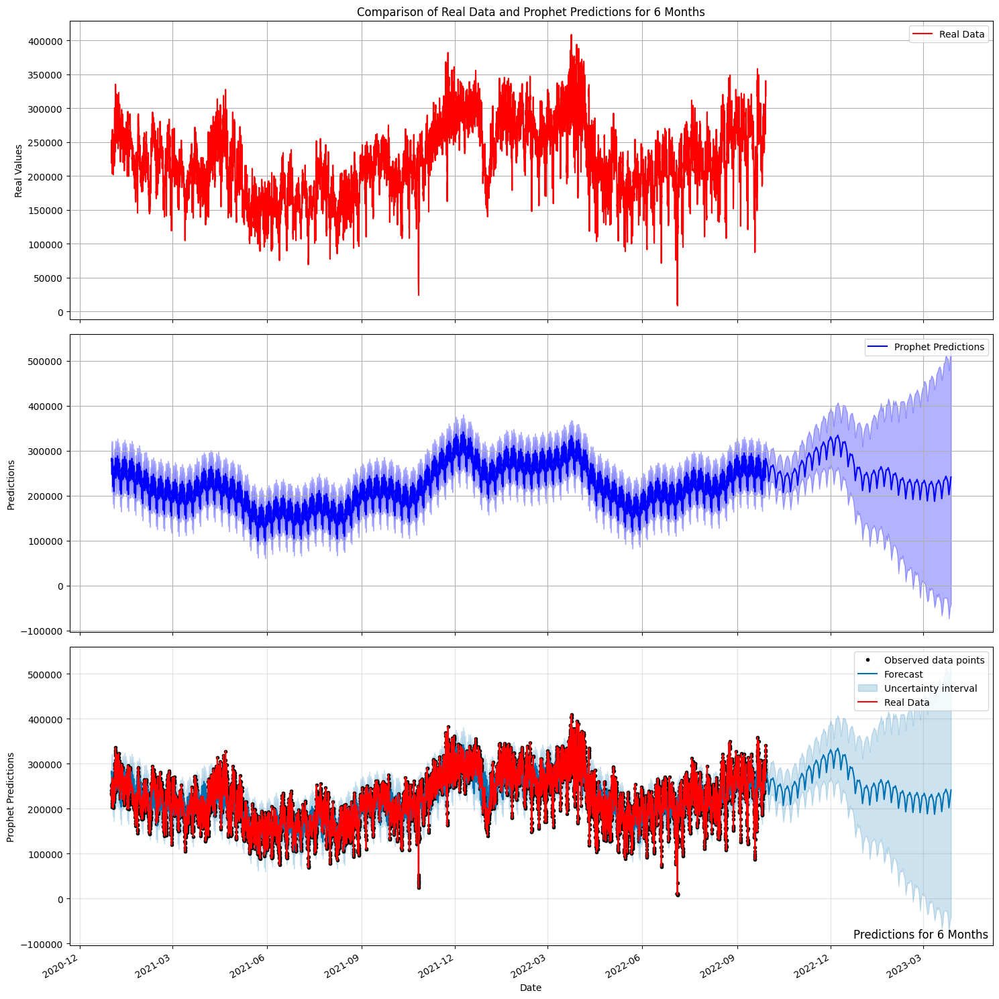

In [166]:
# COMPARISON WITH REAL DATA

# Datapoints for the real dataset
x1 = dataset_Cop['ds']
y1 = dataset_Cop['y']


periods_list = [730, 365, 180]
periods_labels = ['2 Years', '1 Year', '6 Months']

# Loop over periods to generate predictions and plot forecasts
for periods, label in zip(periods_list, periods_labels):
    
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Create the figure and subplots
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

    # Plot real data in the first subplot
    ax1.plot(x1, y1, 'r-', label='Real Data')
    ax1.legend()
    ax1.grid()
    ax1.set_title(f'Comparison of Real Data and Prophet Predictions for {label}')
    ax1.set_ylabel('Real Values')
    ax1.set_xlabel('Date')  
    ax1.tick_params(axis='x', rotation=45)  

    # Plot Prophet predictions in the second subplot
    ax2.plot(x2, y2, 'b-', label='Prophet Predictions')
    ax2.fill_between(x2, forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.3)
    ax2.legend()
    ax2.grid()
    ax2.set_ylabel('Predictions')
    ax2.set_xlabel('Date')  
    ax2.tick_params(axis='x', rotation=45)  

    # Plot Prophet's forecast plot in the third subplot
    fig1 = m.plot(forecast, ax=ax3)  # Plot the forecast on the third subplot
    ax3.plot(x1, y1, 'r-', label='Real Data')  # Plot real data on the third subplot
    ax3.legend()
    ax3.set_xlabel('Date')
    ax3.set_ylabel('Prophet Predictions')
    ax3.tick_params(axis='x', rotation=45)  

    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {label}', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
    
    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

Mean Absolute Percentage Error for 2 Years: 27.83%
Mean Absolute Percentage Error for 1 Year: 27.05%
Mean Absolute Percentage Error for 6 Months: 17.53%


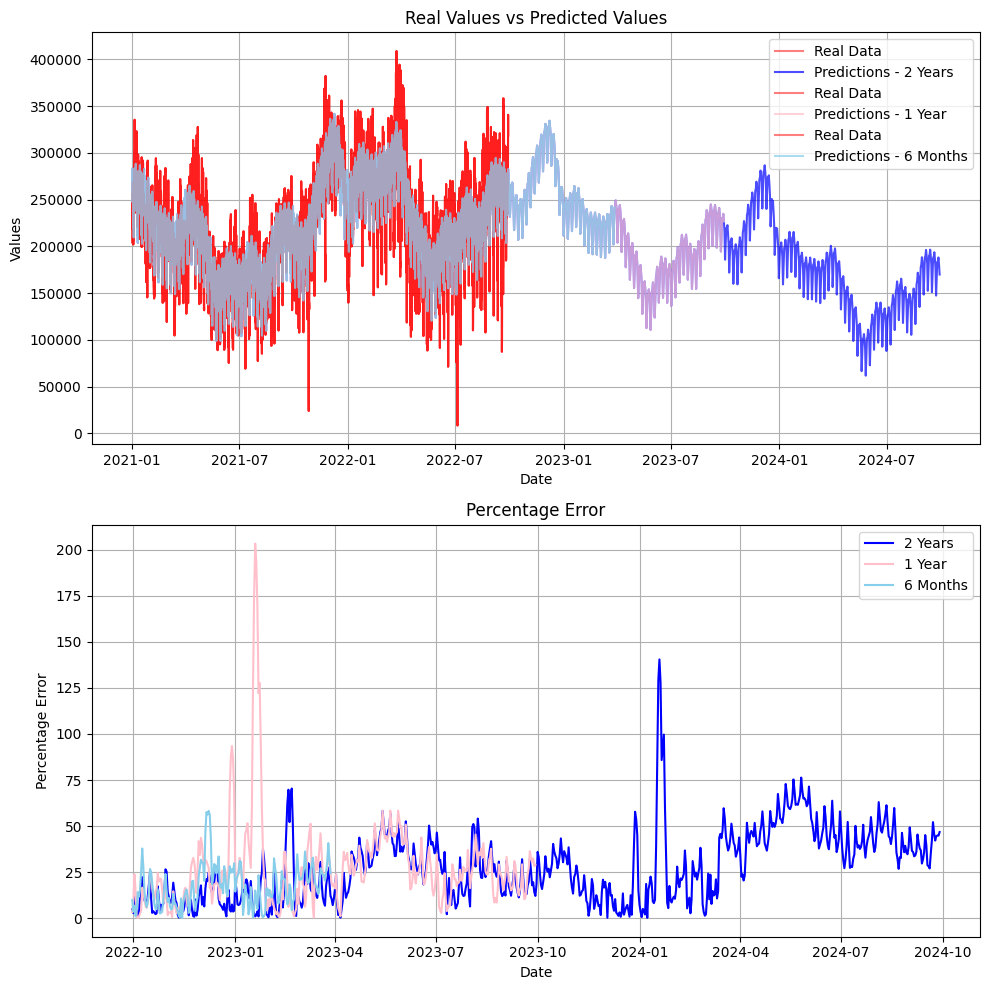

In [167]:
# Initialize subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Define colors for each period
colors = ['blue', 'pink', 'skyblue']

# Loop over periods to generate predictions and plot forecasts
for periods, label, color in zip(periods_list, periods_labels, colors):
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Define data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Compute absolute percentage error
    absolute_percentage_error = abs((dataset_Cop['y'].tail(periods).values - forecast['yhat'].tail(periods).values) / dataset_Cop['y'].tail(periods).values) * 100
    
    # Compute mean absolute percentage error
    mean_absolute_percentage_error = absolute_percentage_error.mean()
    
    print(f'Mean Absolute Percentage Error for {label}: {mean_absolute_percentage_error:.2f}%')
    
    # Plot real values vs predicted values in the first subplot
    axs[0].plot(x1, y1, 'r-', label='Real Data', alpha=0.5)
    axs[0].plot(x2, y2, label=f'Predictions - {label}', color=color, alpha=0.7)
    axs[0].set_title('Real Values vs Predicted Values')
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Values')
    axs[0].legend()
    
    # Plot percentage error in the second subplot
    axs[1].plot(x2.tail(periods), absolute_percentage_error, label=label, color=color)
    axs[1].set_title('Percentage Error')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Percentage Error')
    axs[1].legend()

# Add grid lines to both subplots
    axs[0].grid(True)
    axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

  

Repeat the analysis considering a smaller period of time: 1 month, 3 Weeks and 2 Weeks

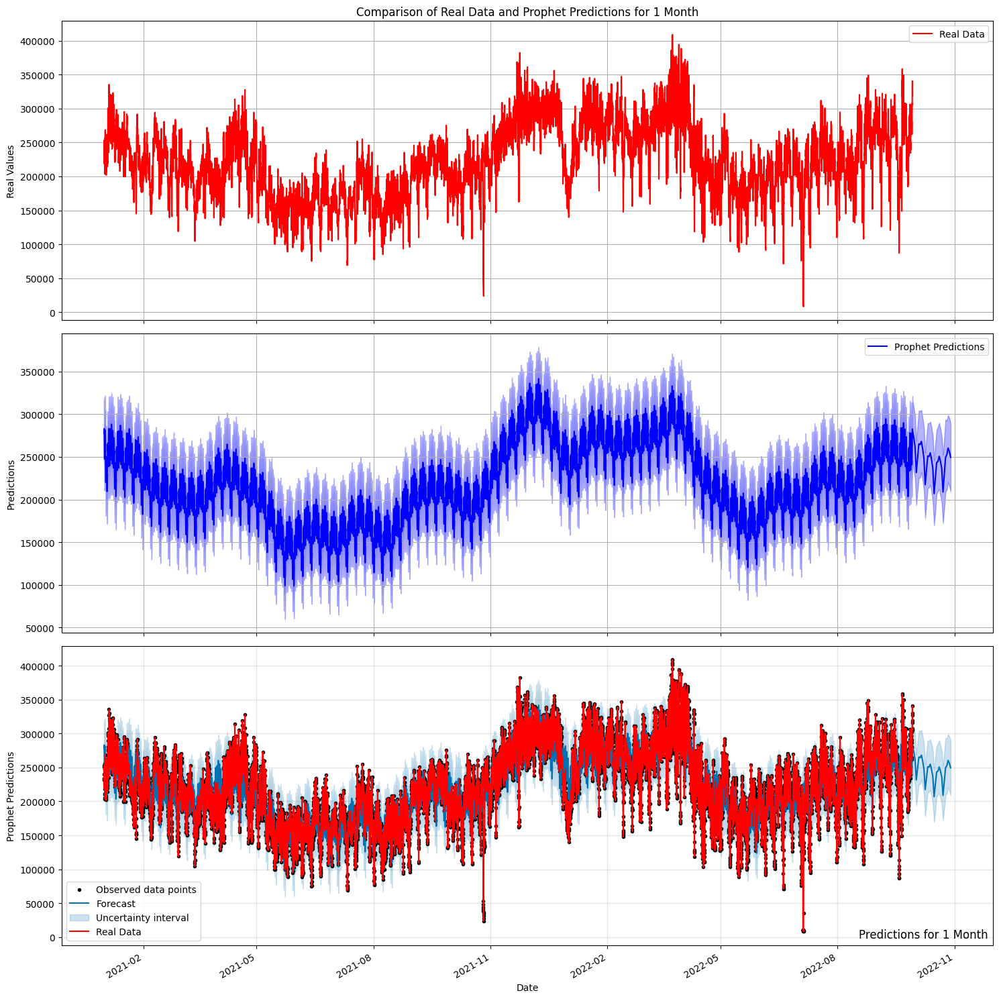

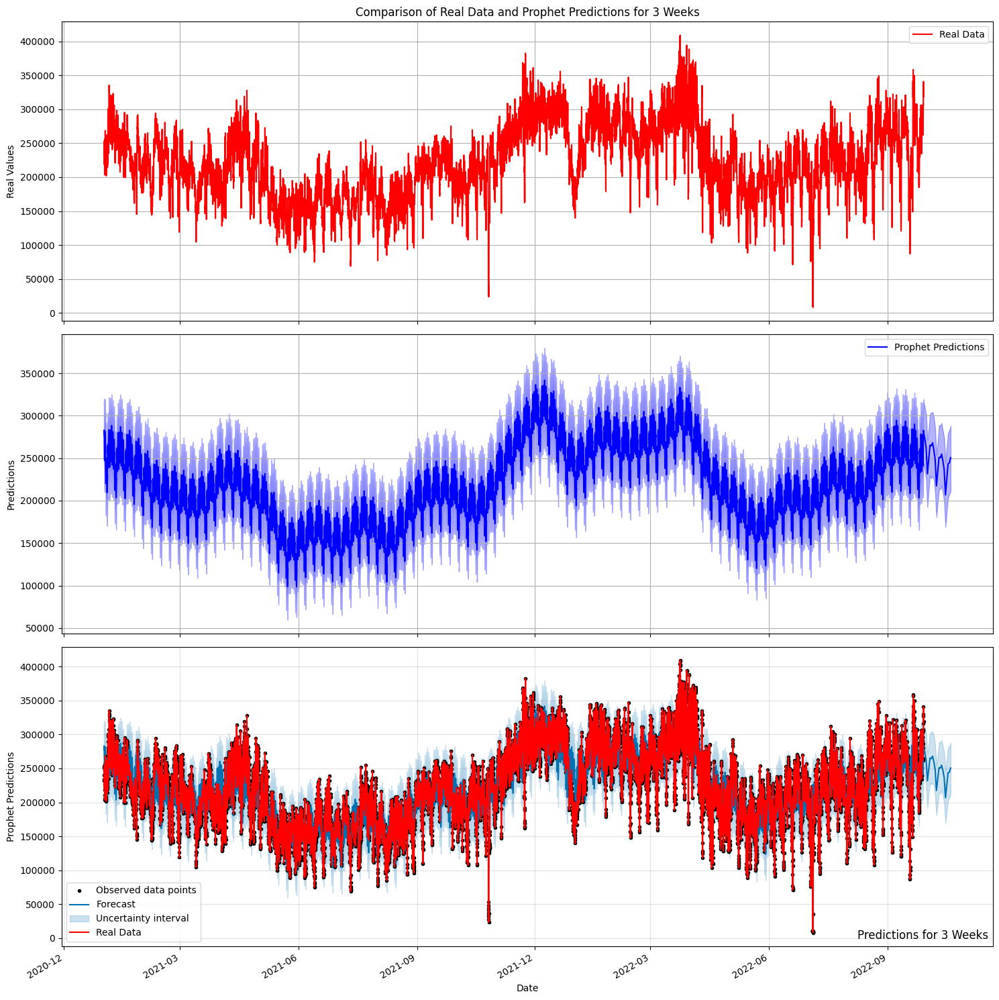

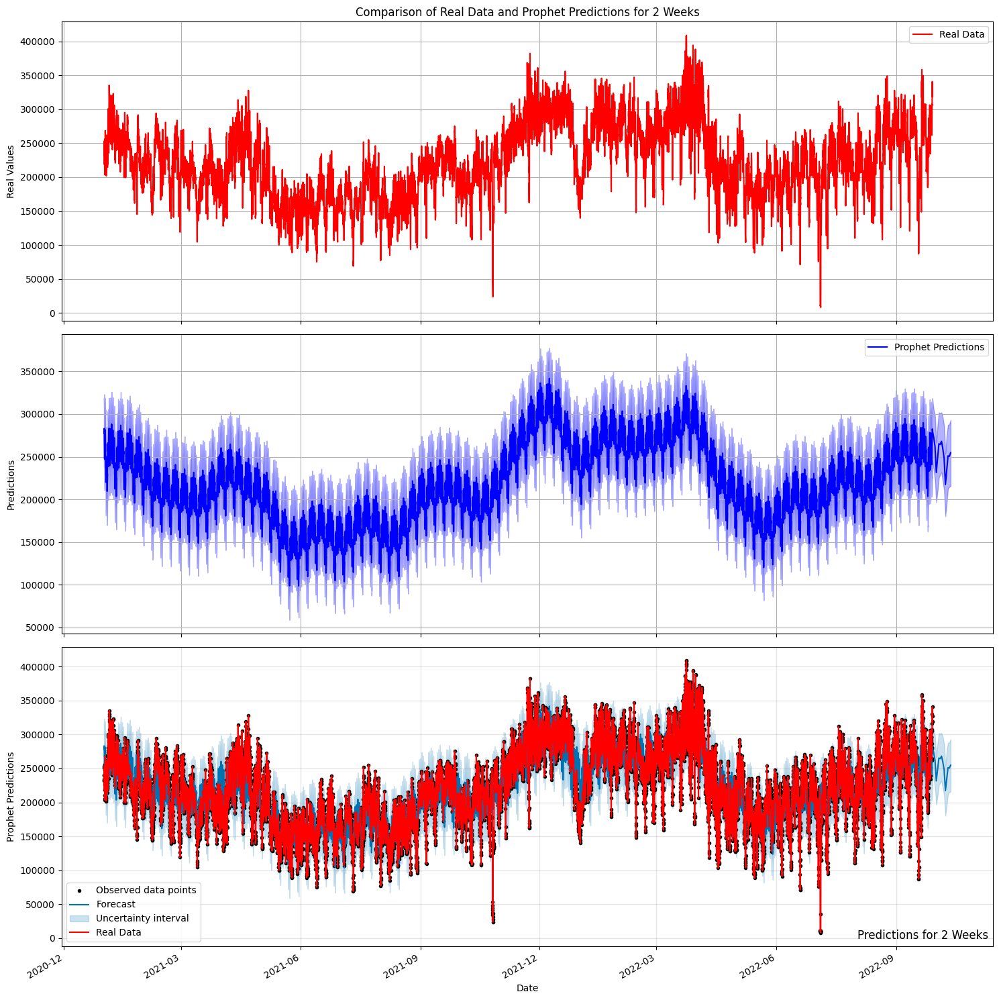

In [168]:
# COMPARISON WITH REAL DATA

# Datapoints for the real dataset
x1 = dataset_Cop['ds']
y1 = dataset_Cop['y']


Nperiods_list = [30, 21, 14]
Nperiods_labels = ['1 Month', '3 Weeks', '2 Weeks']

# Loop over periods to generate predictions and plot forecasts
for periods, label in zip(Nperiods_list, Nperiods_labels):
    
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Create the figure and subplots
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

    # Plot real data in the first subplot
    ax1.plot(x1, y1, 'r-', label='Real Data')
    ax1.legend()
    ax1.grid()
    ax1.set_title(f'Comparison of Real Data and Prophet Predictions for {label}')
    ax1.set_ylabel('Real Values')
    ax1.set_xlabel('Date')  
    ax1.tick_params(axis='x', rotation=45)  

    # Plot Prophet predictions in the second subplot
    ax2.plot(x2, y2, 'b-', label='Prophet Predictions')
    ax2.fill_between(x2, forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.3)
    ax2.legend()
    ax2.grid()
    ax2.set_ylabel('Predictions')
    ax2.set_xlabel('Date')  
    ax2.tick_params(axis='x', rotation=45)  

    # Plot Prophet's forecast plot in the third subplot
    fig1 = m.plot(forecast, ax=ax3)  # Plot the forecast on the third subplot
    ax3.plot(x1, y1, 'r-', label='Real Data')  # Plot real data on the third subplot
    ax3.legend()
    ax3.set_xlabel('Date')
    ax3.set_ylabel('Prophet Predictions')
    ax3.tick_params(axis='x', rotation=45)  

    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {label}', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
    
    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

Mean Absolute Percentage Error for 1 Month: 16.09%
Mean Absolute Percentage Error for 3 Weeks: 15.79%
Mean Absolute Percentage Error for 2 Weeks: 14.91%


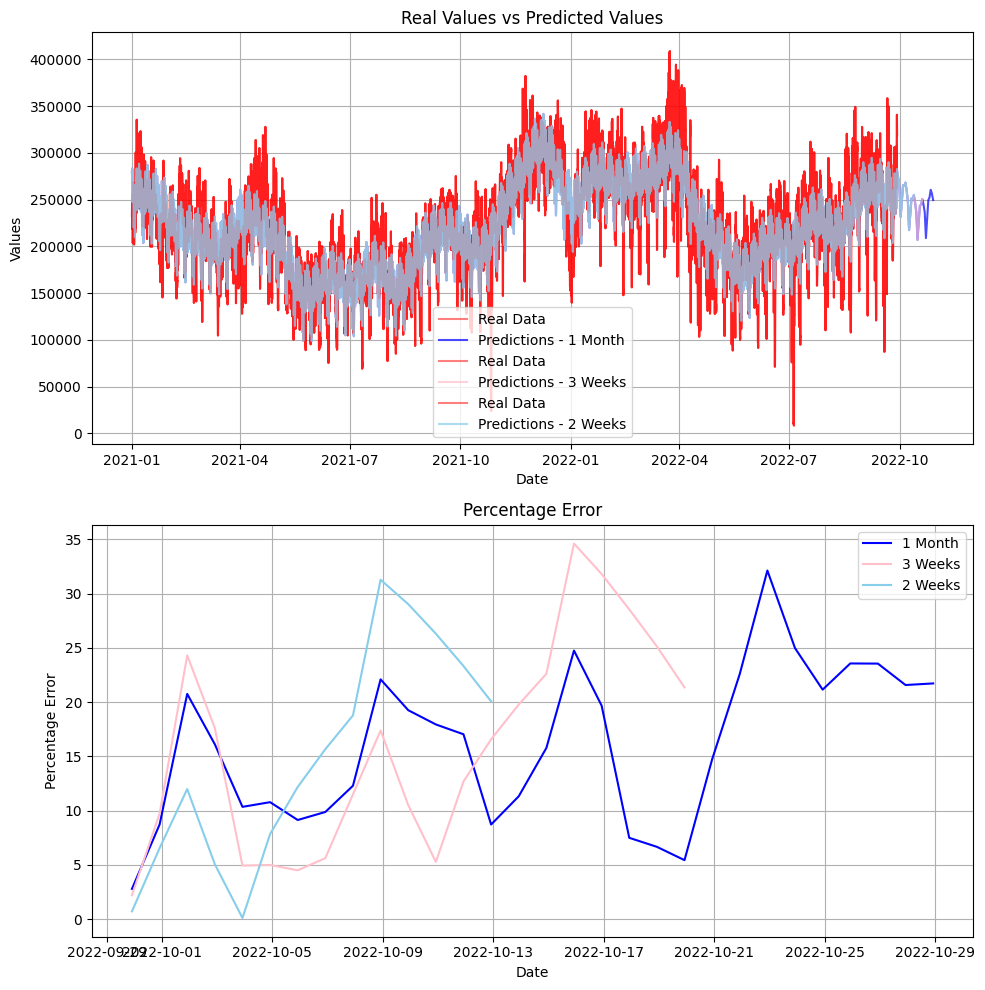

In [169]:
# Initialize subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Define colors for each period
colors = ['blue', 'pink', 'skyblue']

# Loop over periods to generate predictions and plot forecasts
for periods, label, color in zip(Nperiods_list, Nperiods_labels, colors):
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Define data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Compute absolute percentage error
    absolute_percentage_error = abs((dataset_Cop['y'].tail(periods).values - forecast['yhat'].tail(periods).values) / dataset_Cop['y'].tail(periods).values) * 100
    
    # Compute mean absolute percentage error
    mean_absolute_percentage_error = absolute_percentage_error.mean()
    
    print(f'Mean Absolute Percentage Error for {label}: {mean_absolute_percentage_error:.2f}%')
    
    # Plot real values vs predicted values in the first subplot
    axs[0].plot(x1, y1, 'r-', label='Real Data', alpha=0.5)
    axs[0].plot(x2, y2, label=f'Predictions - {label}', color=color, alpha=0.7)
    axs[0].set_title('Real Values vs Predicted Values')
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Values')
    axs[0].legend()
    
    # Plot percentage error in the second subplot
    axs[1].plot(x2.tail(periods), absolute_percentage_error, label=label, color=color)
    axs[1].set_title('Percentage Error')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Percentage Error')
    axs[1].legend()

# Add grid lines to both subplots
    axs[0].grid(True)
    axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

  

**!**
From these analysis is visible that the Mean Absolute Percentage Error stays relatively high even if the periods considered are smaller. 

## **POWER CONSUMPTION (3 years)**

In [149]:
# Importing dataset
dataset_P = pd.read_csv('../PowerDataset_3_years.csv', index_col=0, parse_dates=True) 
dataset_P.index = pd.to_datetime(dataset_P.index).tz_localize(None) # To remove the localization in the datetime format
dataset_P = dataset_P.sum(axis=1)

dataset_P

timestamp
2020-05-02 17:00:00    637540.477086
2020-05-02 18:00:00    648837.510153
2020-05-02 19:00:00    608330.452245
2020-05-02 20:00:00    624141.382195
2020-05-02 21:00:00    654521.239171
                           ...      
2022-09-28 18:00:00    880386.676768
2022-09-28 19:00:00    880300.777778
2022-09-28 20:00:00    892000.722222
2022-09-28 21:00:00    847950.277778
2022-09-28 22:00:00    844940.000000
Length: 21102, dtype: float64

In [150]:
dataset_P = dataset_P.reset_index()
dataset_P.rename(columns={'timestamp':'ds', 0:'y' }, inplace=True)

dataset_P

,ds,y
0,2020-05-02 17:00:00,637540.477086
1,2020-05-02 18:00:00,648837.510153
2,2020-05-02 19:00:00,608330.452245
3,2020-05-02 20:00:00,624141.382195
4,2020-05-02 21:00:00,654521.239171
...,...,...
21097,2022-09-28 18:00:00,880386.676768
21098,2022-09-28 19:00:00,880300.777778
21099,2022-09-28 20:00:00,892000.722222
21100,2022-09-28 21:00:00,847950.277778


10:37:54 - cmdstanpy - INFO - Chain [1] start processing
10:38:16 - cmdstanpy - INFO - Chain [1] done processing


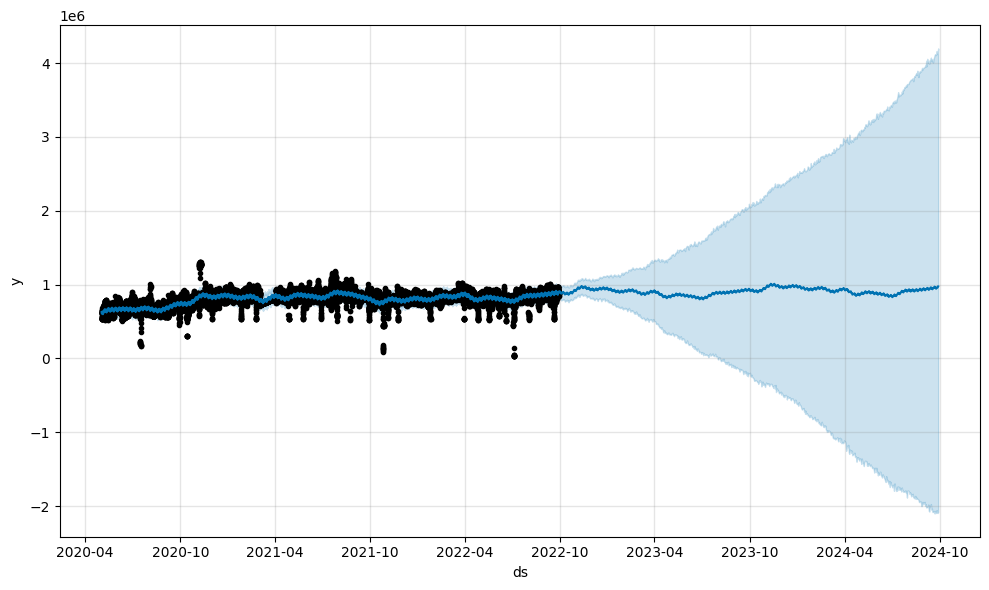

In [151]:
m = Prophet(yearly_seasonality = True, weekly_seasonality=True, daily_seasonality=True) # forcing to consider seasonality
m.fit(dataset_P)

#consider 6 months assuming to have 30 days in a months
future = m.make_future_dataframe(periods=365*2)
future.tail()

forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

fig1 = m.plot(forecast)

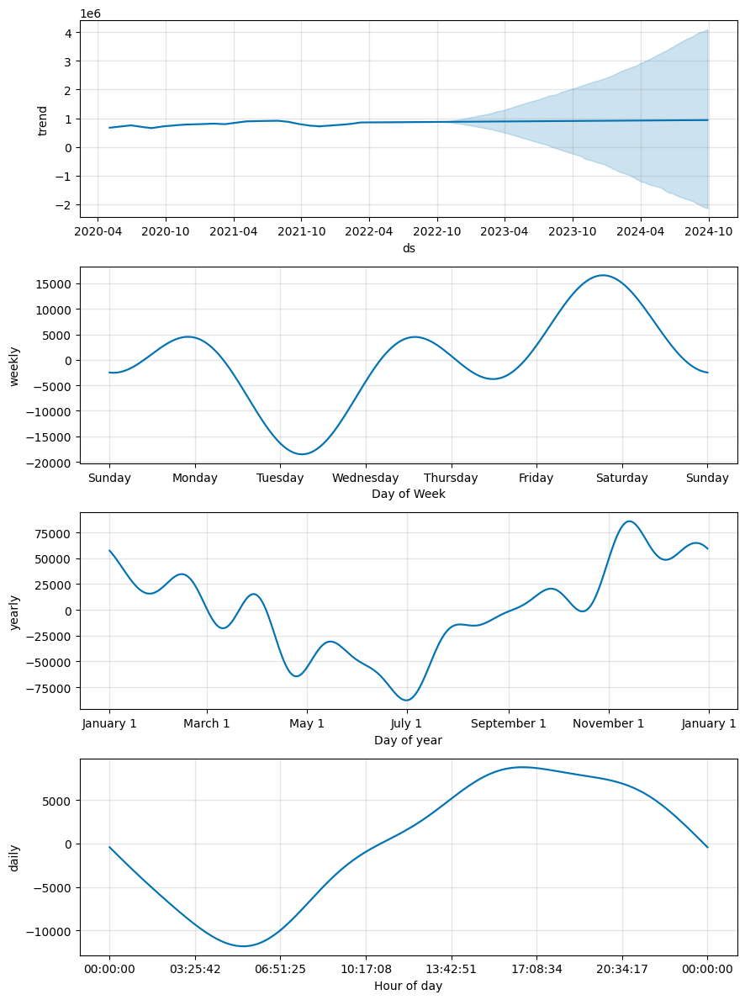

In [152]:
fig2 = m.plot_components(forecast)
plt.savefig('../PLOTS/PWR_prophet.png', dpi=300) # Code to export the plot as an image

Comparison with real values

Starting from Jen 2020 to the end of dec 2022 and predict. 
Assume to consider first **6 months**, then **12**, **24** to understand which is the optimal period in order to see when we have the optimal performances.

10:38:38 - cmdstanpy - INFO - Chain [1] start processing
10:38:54 - cmdstanpy - INFO - Chain [1] done processing


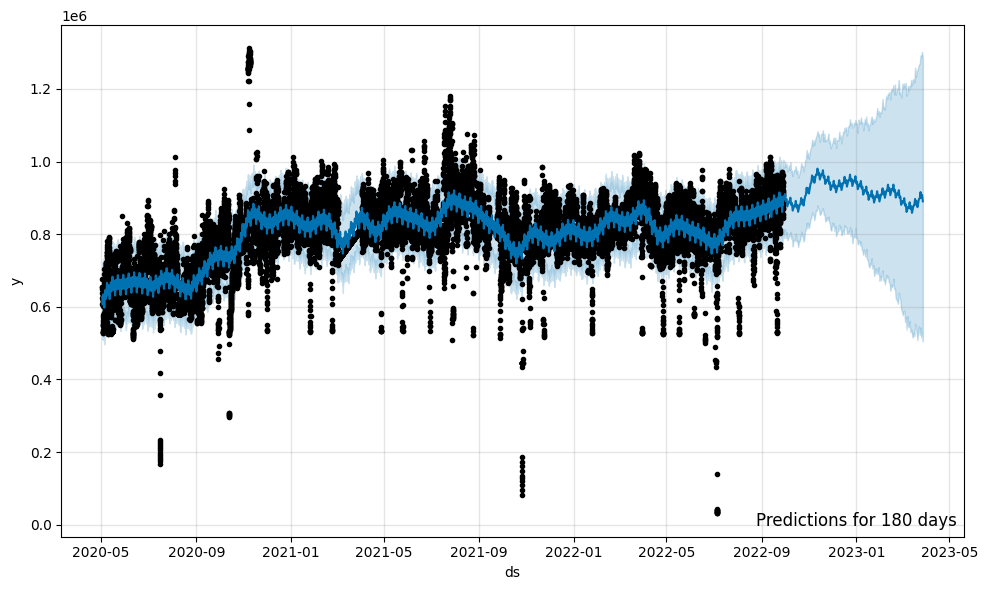

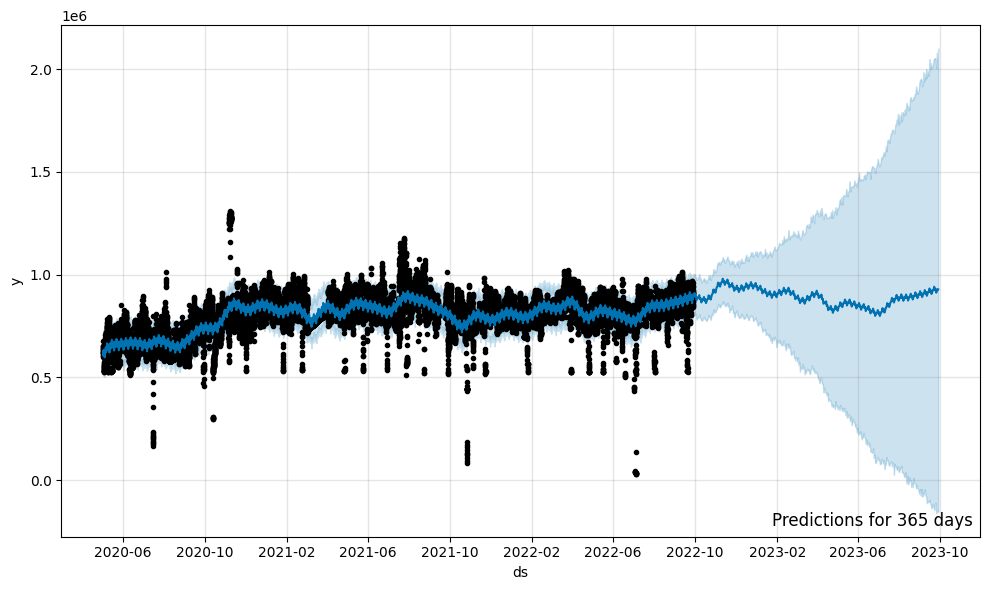

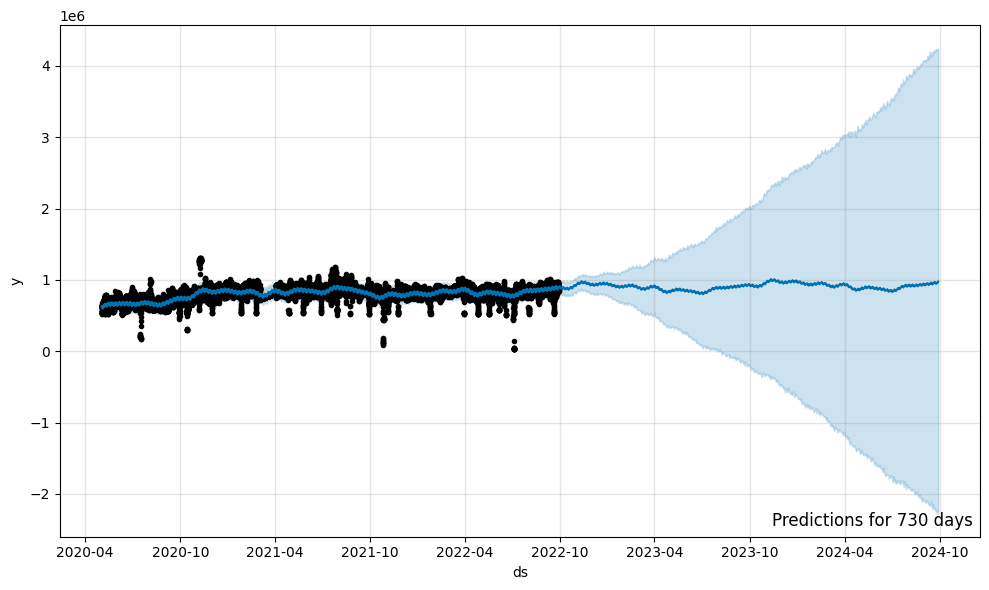

In [153]:
# Create and fit Prophet model
m = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
m.fit(dataset_P)

# Define periods
periods_list = [180, 365, 730]

# Loop over periods to generate predictions and plot forecasts
for periods in periods_list:
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Plot forecast
    fig = m.plot(forecast)
    
    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {periods} days', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
   
    # Show the plot
    plt.show()

    # Print predictions for the current period
    # print(f"Predictions for {periods} days:")
    # print(forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail())
    # print("\n")



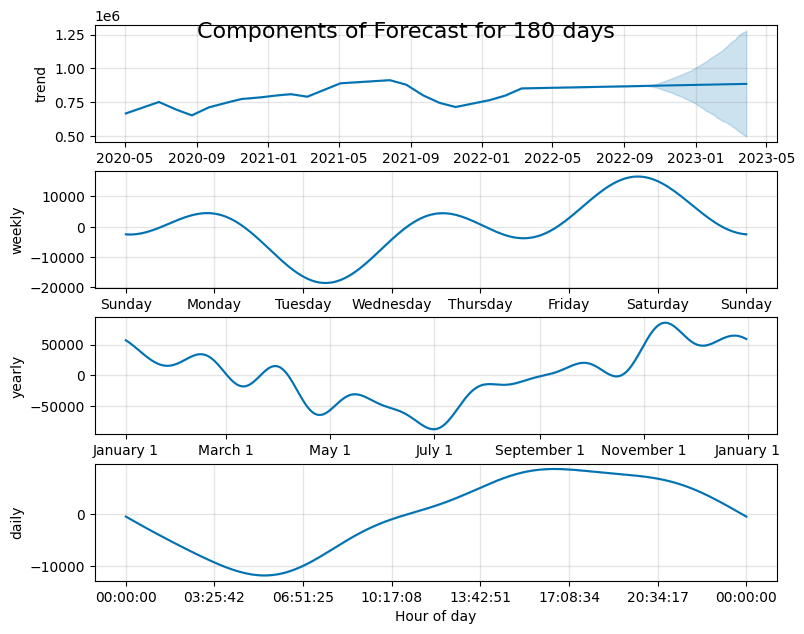

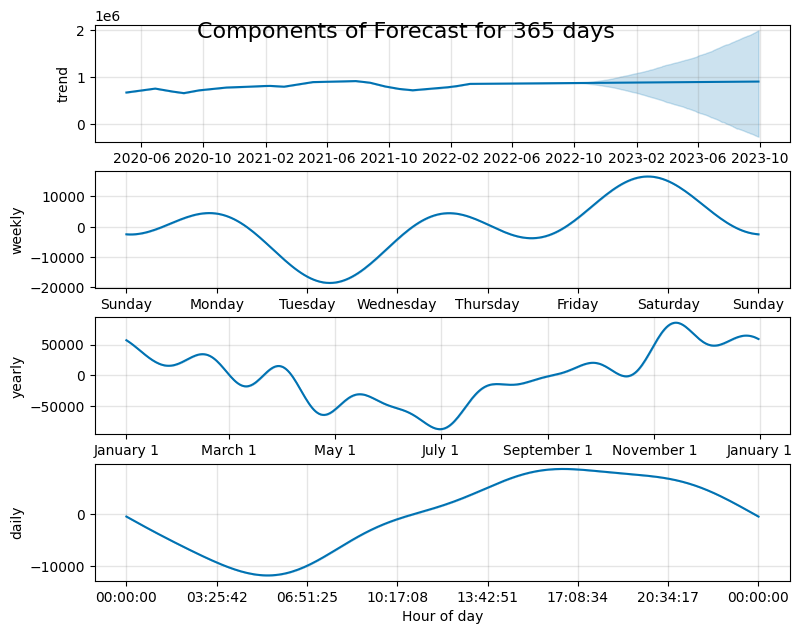

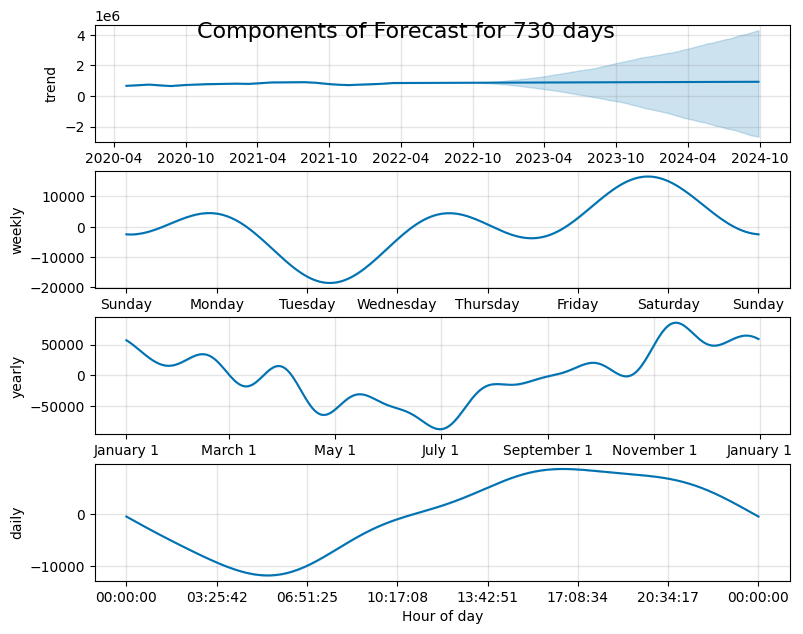

In [154]:
# Loop over periods to generate predictions and plot components
for periods in periods_list:
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Plot components of the forecast
    fig = m.plot_components(forecast)
    
    # Add label to specify the period being predicted
    plt.suptitle(f'Components of Forecast for {periods} days', fontsize=16)
    
    # Resize the figure
    fig.set_size_inches(8, 6)
    
    # Save the plot as an image
    plt.savefig(f'../PLOTS/PWR_prophet_{periods}days.png', dpi=300)
    
    # Show the plot
    plt.show()


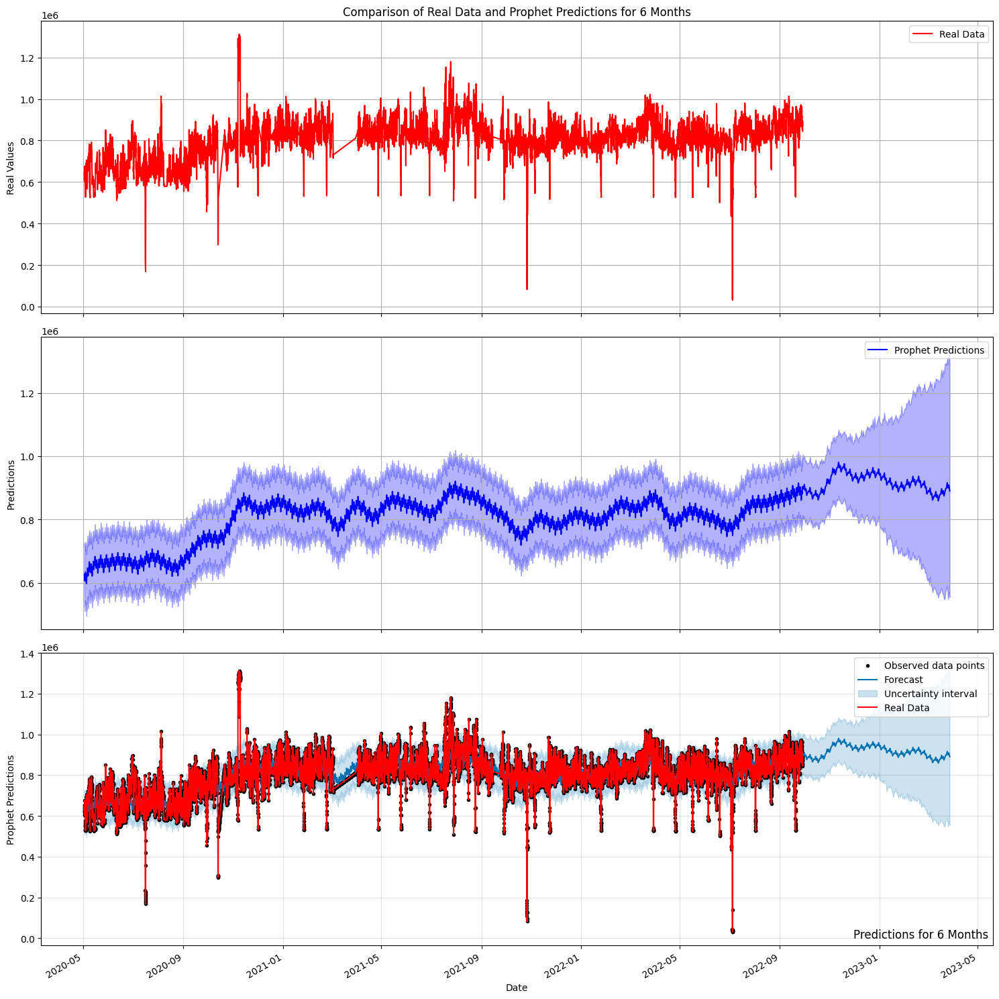

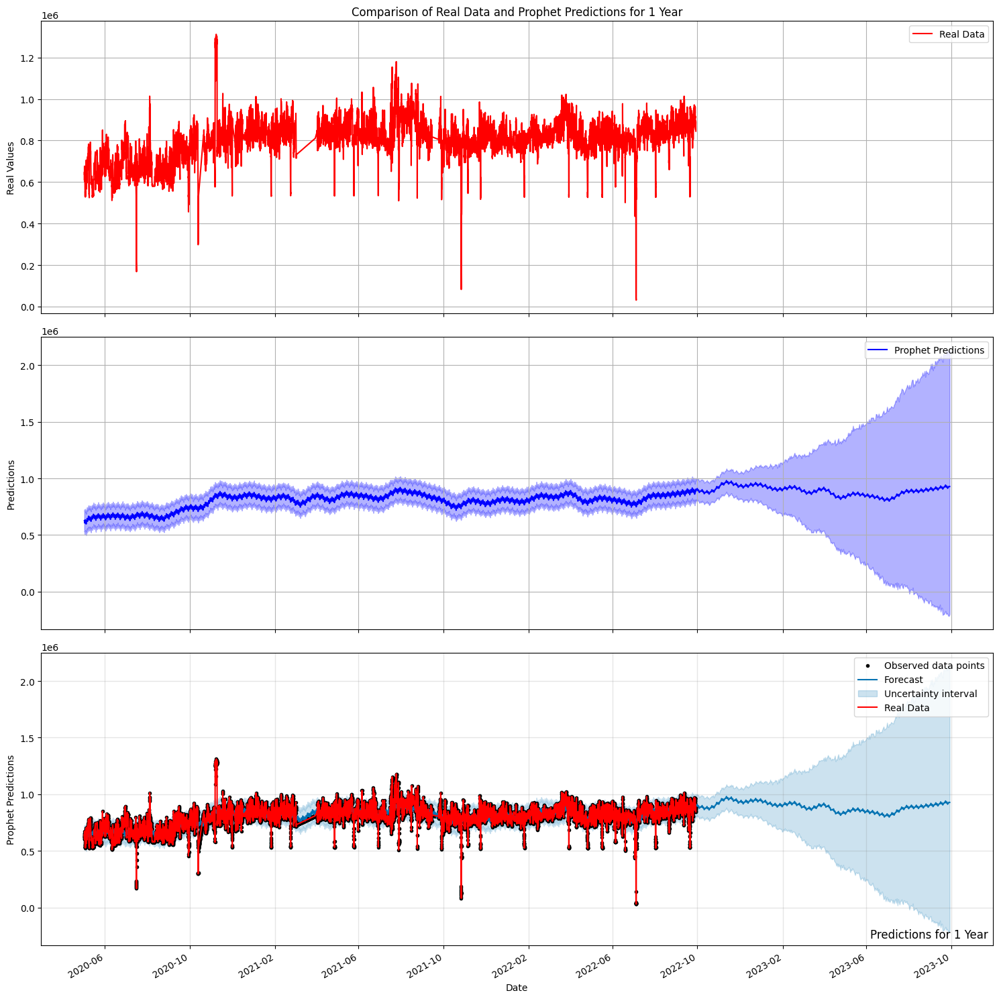

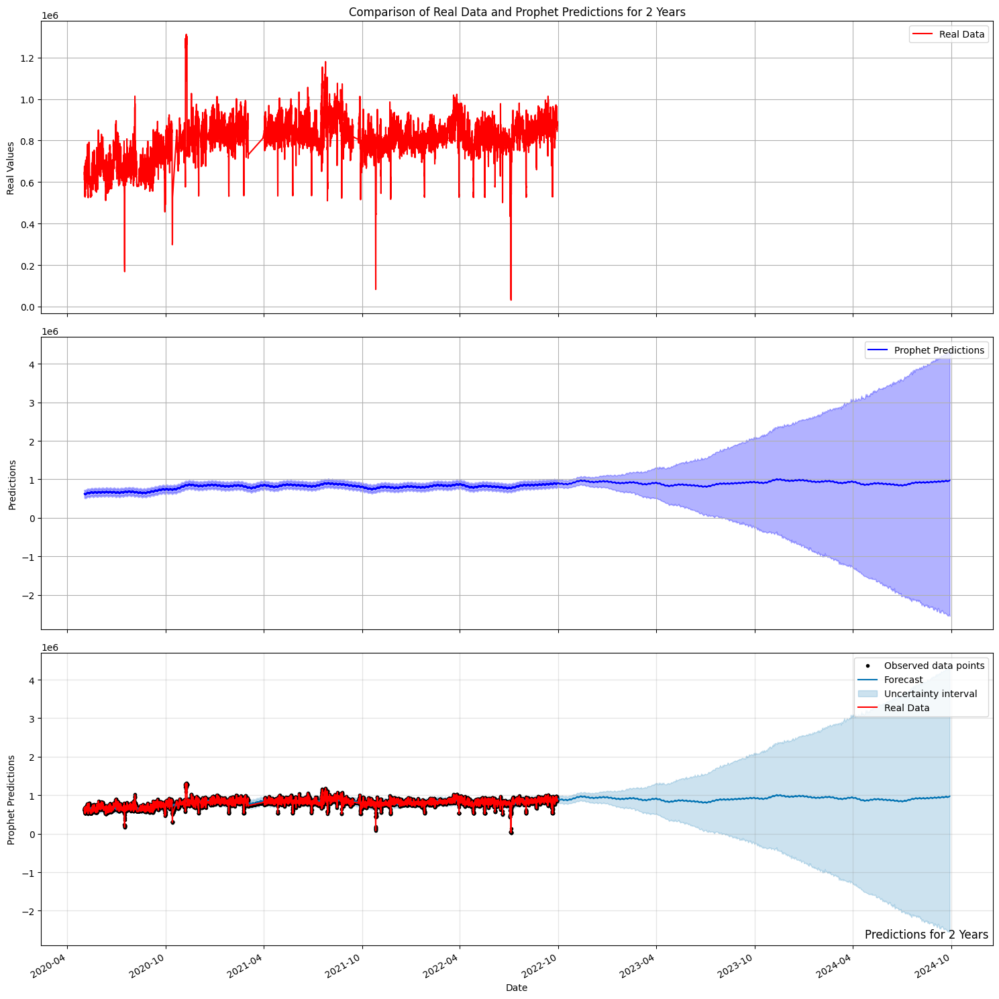

In [155]:


# Datapoints for the real dataset
x1 = dataset_P['ds']
y1 = dataset_P['y']


periods_list = [180, 365, 730]
periods_labels = ['6 Months', '1 Year', '2 Years']

# Loop over periods to generate predictions and plot forecasts
for periods, label in zip(periods_list, periods_labels):
    
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Create the figure and subplots
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

    # Plot real data in the first subplot
    ax1.plot(x1, y1, 'r-', label='Real Data')
    ax1.legend()
    ax1.grid()
    ax1.set_title(f'Comparison of Real Data and Prophet Predictions for {label}')
    ax1.set_ylabel('Real Values')
    ax1.set_xlabel('Date')  
    ax1.tick_params(axis='x', rotation=45)  

    # Plot Prophet predictions in the second subplot
    ax2.plot(x2, y2, 'b-', label='Prophet Predictions')
    ax2.fill_between(x2, forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.3)
    ax2.legend()
    ax2.grid()
    ax2.set_ylabel('Predictions')
    ax2.set_xlabel('Date')  
    ax2.tick_params(axis='x', rotation=45)  

    # Plot Prophet's forecast plot in the third subplot
    fig1 = m.plot(forecast, ax=ax3)  # Plot the forecast on the third subplot
    ax3.plot(x1, y1, 'r-', label='Real Data')  # Plot real data on the third subplot
    ax3.legend()
    ax3.set_xlabel('Date')
    ax3.set_ylabel('Prophet Predictions')
    ax3.tick_params(axis='x', rotation=45)  

    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {label}', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
    
    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()



Now let's make a plot to show the percentage error between the predicted values for each period and the real values

Mean Absolute Percentage Error for 6 Months: 5.46%
Mean Absolute Percentage Error for 1 Year: 8.83%
Mean Absolute Percentage Error for 2 Years: 8.18%


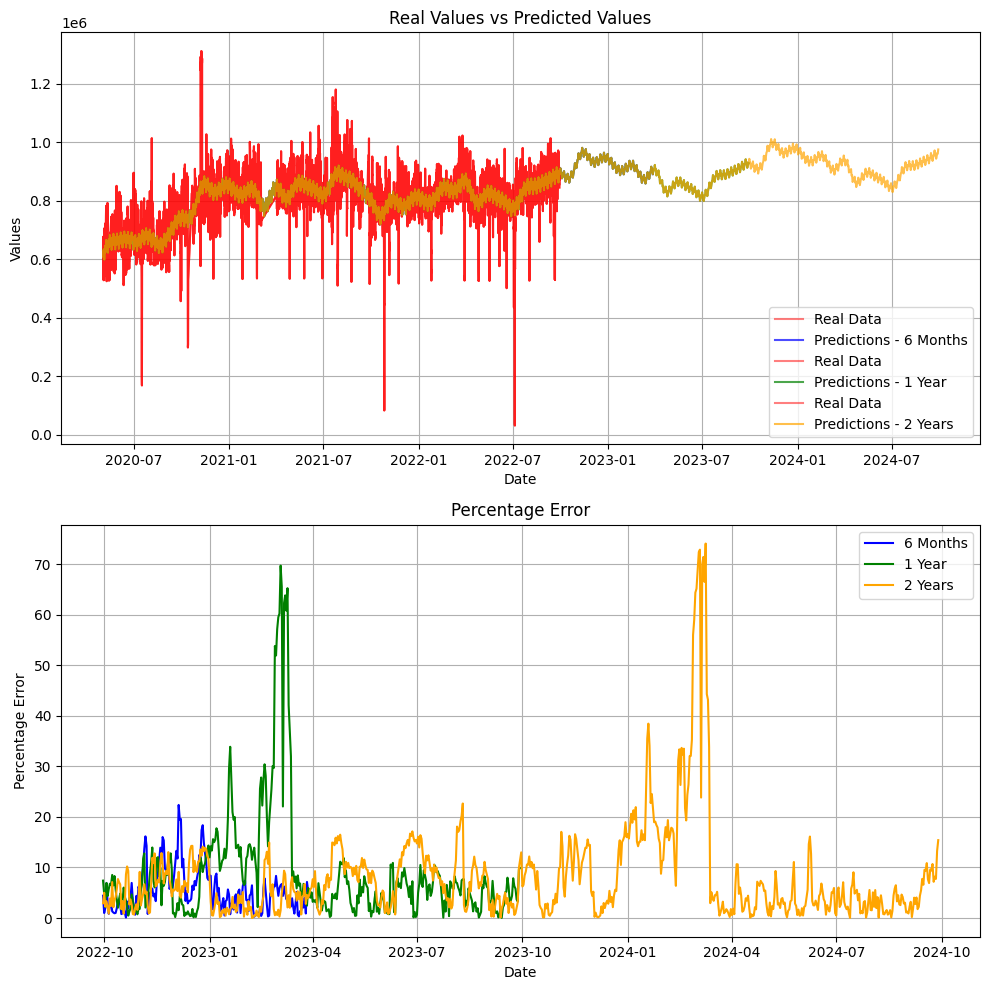

In [156]:
# Initialize subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Define colors for each period
colors = ['blue', 'green', 'orange']

# Loop over periods to generate predictions and plot forecasts
for periods, label, color in zip(periods_list, periods_labels, colors):
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Define data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Compute absolute percentage error
    absolute_percentage_error = abs((dataset_P['y'].tail(periods).values - forecast['yhat'].tail(periods).values) / dataset_P['y'].tail(periods).values) * 100
    
    # Compute mean absolute percentage error
    mean_absolute_percentage_error = absolute_percentage_error.mean()
    
    print(f'Mean Absolute Percentage Error for {label}: {mean_absolute_percentage_error:.2f}%')
    
    # Plot real values vs predicted values in the first subplot
    axs[0].plot(x1, y1, 'r-', label='Real Data', alpha=0.5)
    axs[0].plot(x2, y2, label=f'Predictions - {label}', color=color, alpha=0.7)
    axs[0].set_title('Real Values vs Predicted Values')
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Values')
    axs[0].legend()
    
    # Plot percentage error in the second subplot
    axs[1].plot(x2.tail(periods), absolute_percentage_error, label=label, color=color)
    axs[1].set_title('Percentage Error')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Percentage Error')
    axs[1].legend()

# Add grid lines to both subplots
    axs[0].grid(True)
    axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

  

Analyzing the corresponding percentage errors it's evident that the predictions for a 6-month period exhibit significantly lower error rates.
To gain deeper insights into the optimal prediction period yielding optimal performance, let's conduct predictions for shorter periods and evaluate their performance.

If you've achieved a relatively low percentage error on 6-month predictions, it's worth considering exploring both shorter and longer prediction periods to determine the optimal forecasting horizon. 

For longer periods, assessing predictions for 1 or 2 years could provide insight into whether the low percentage error persists over extended timeframes. 

On the other hand, shorter prediction periods, such as 1 or 3 months, may offer the opportunity to further reduce error rates by focusing on shorter-term trends and patterns. 

Ultimately, the choice of prediction period depends on specific needs, forecasting goals, and the desired level of accuracy within the context of your particular problem.

Predictions for **3 months**, **1 months**, **3weeks**

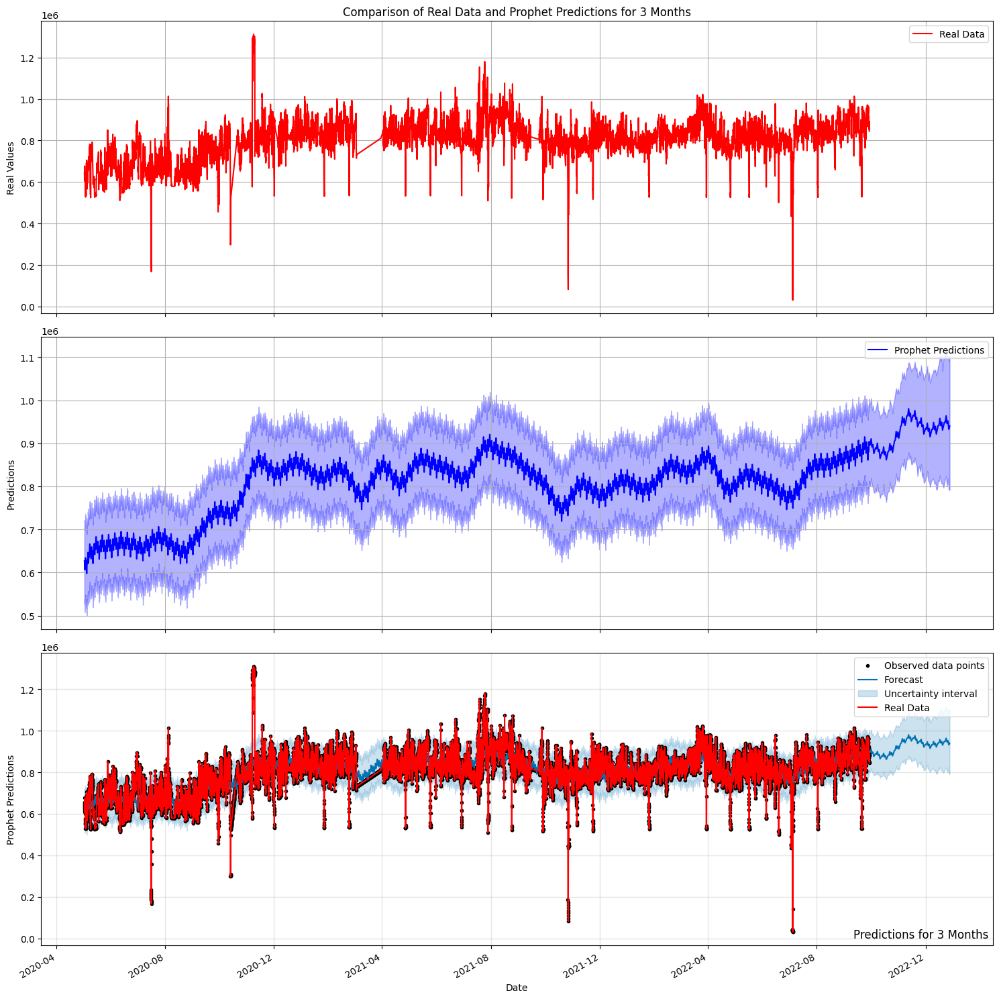

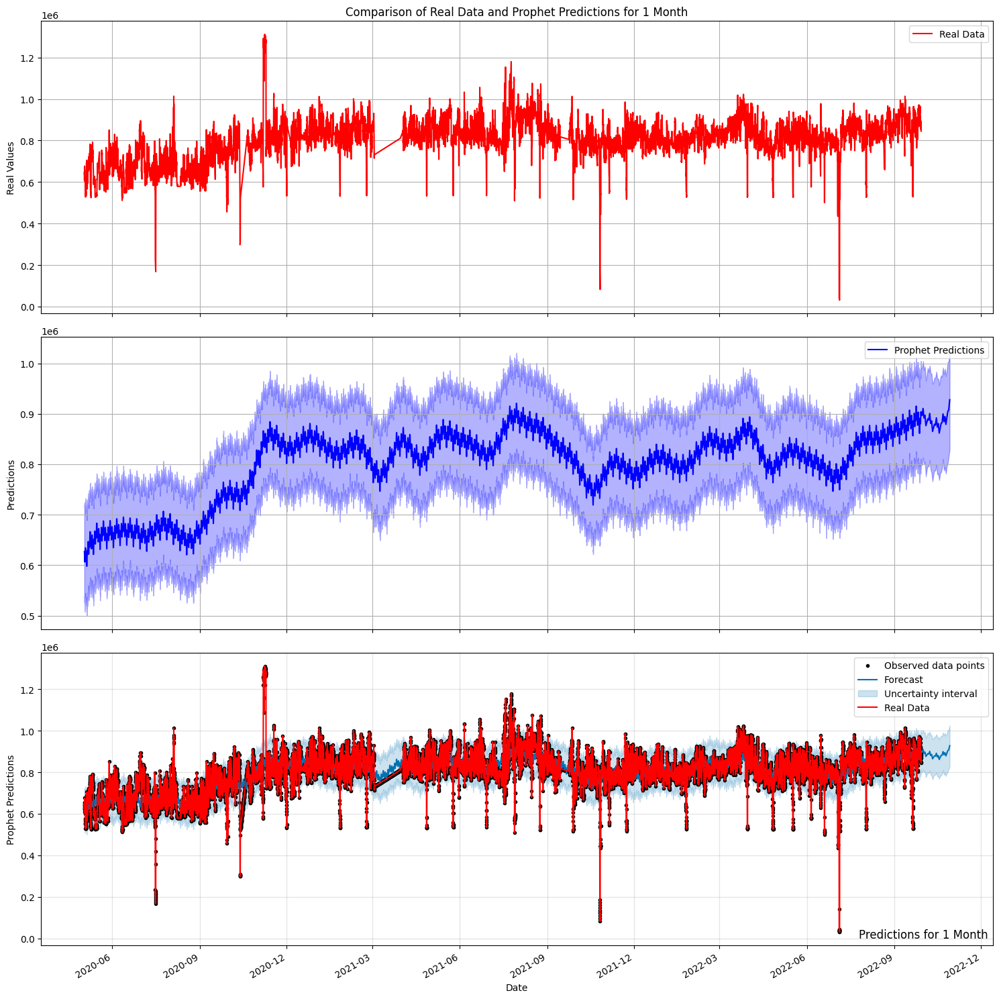

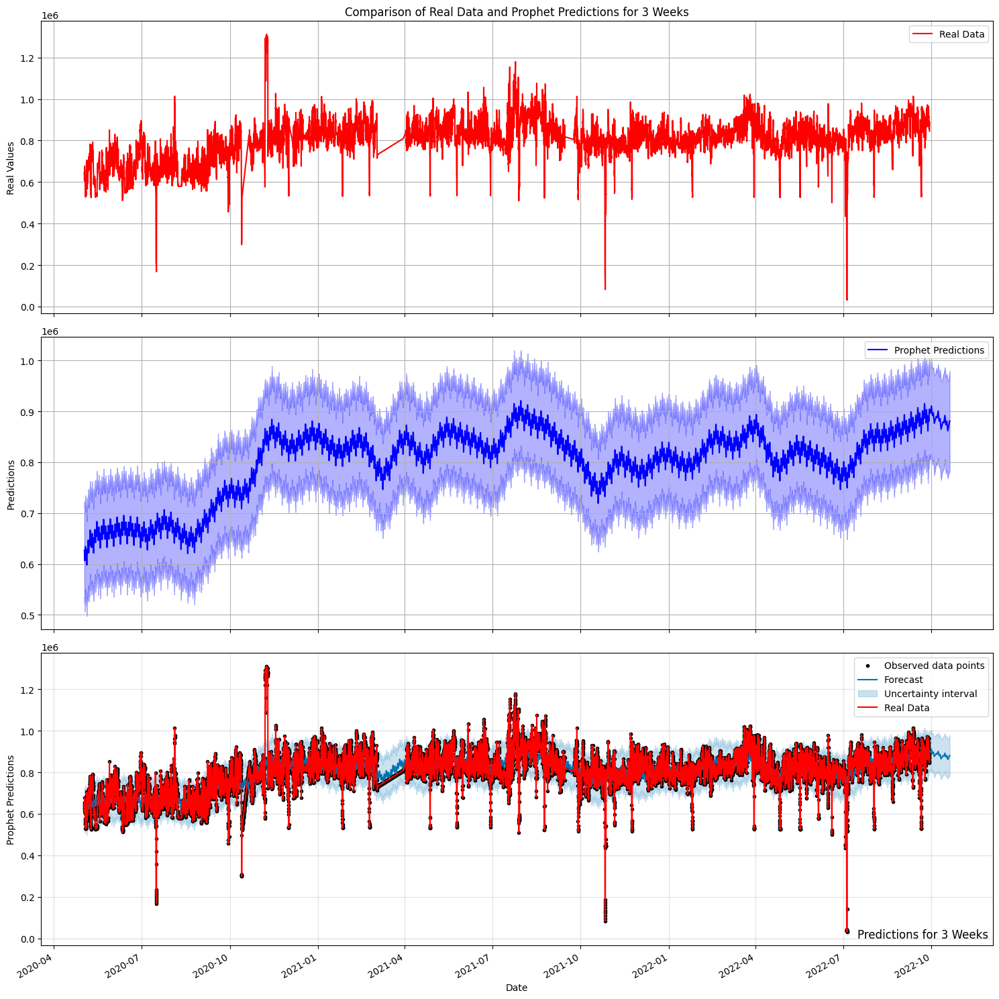

In [157]:
# Datapoints for the real dataset
x1 = dataset_P['ds']
y1 = dataset_P['y']


new_periods_list = [90, 30, 21]
new_periods_labels = ['3 Months', '1 Month', '3 Weeks']

# Loop over periods to generate predictions and plot forecasts
for periods, label in zip(new_periods_list, new_periods_labels):
    
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Create the figure and subplots
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15), sharex=True)

    # Plot real data in the first subplot
    ax1.plot(x1, y1, 'r-', label='Real Data')
    ax1.legend()
    ax1.grid()
    ax1.set_title(f'Comparison of Real Data and Prophet Predictions for {label}')
    ax1.set_ylabel('Real Values')
    ax1.set_xlabel('Date')  
    ax1.tick_params(axis='x', rotation=45)  

    # Plot Prophet predictions in the second subplot
    ax2.plot(x2, y2, 'b-', label='Prophet Predictions')
    ax2.fill_between(x2, forecast['yhat_lower'], forecast['yhat_upper'], color='blue', alpha=0.3)
    ax2.legend()
    ax2.grid()
    ax2.set_ylabel('Predictions')
    ax2.set_xlabel('Date')  
    ax2.tick_params(axis='x', rotation=45)  

    # Plot Prophet's forecast plot in the third subplot
    fig1 = m.plot(forecast, ax=ax3)  # Plot the forecast on the third subplot
    ax3.plot(x1, y1, 'r-', label='Real Data')  # Plot real data on the third subplot
    ax3.legend()
    ax3.set_xlabel('Date')
    ax3.set_ylabel('Prophet Predictions')
    ax3.tick_params(axis='x', rotation=45)  

    # Add label to specify the period being predicted
    plt.annotate(f'Predictions for {label}', 
                 xy=(1, 0), 
                 xycoords='axes fraction', 
                 fontsize=12, 
                 xytext=(-5, 5), 
                 textcoords='offset points', 
                 ha='right', 
                 va='bottom')
    
    
    fig.autofmt_xdate()

    plt.tight_layout()
    plt.show()

Mean Absolute Percentage Error for 3 Months: 4.22%
Mean Absolute Percentage Error for 1 Month: 3.42%
Mean Absolute Percentage Error for 3 Weeks: 2.00%


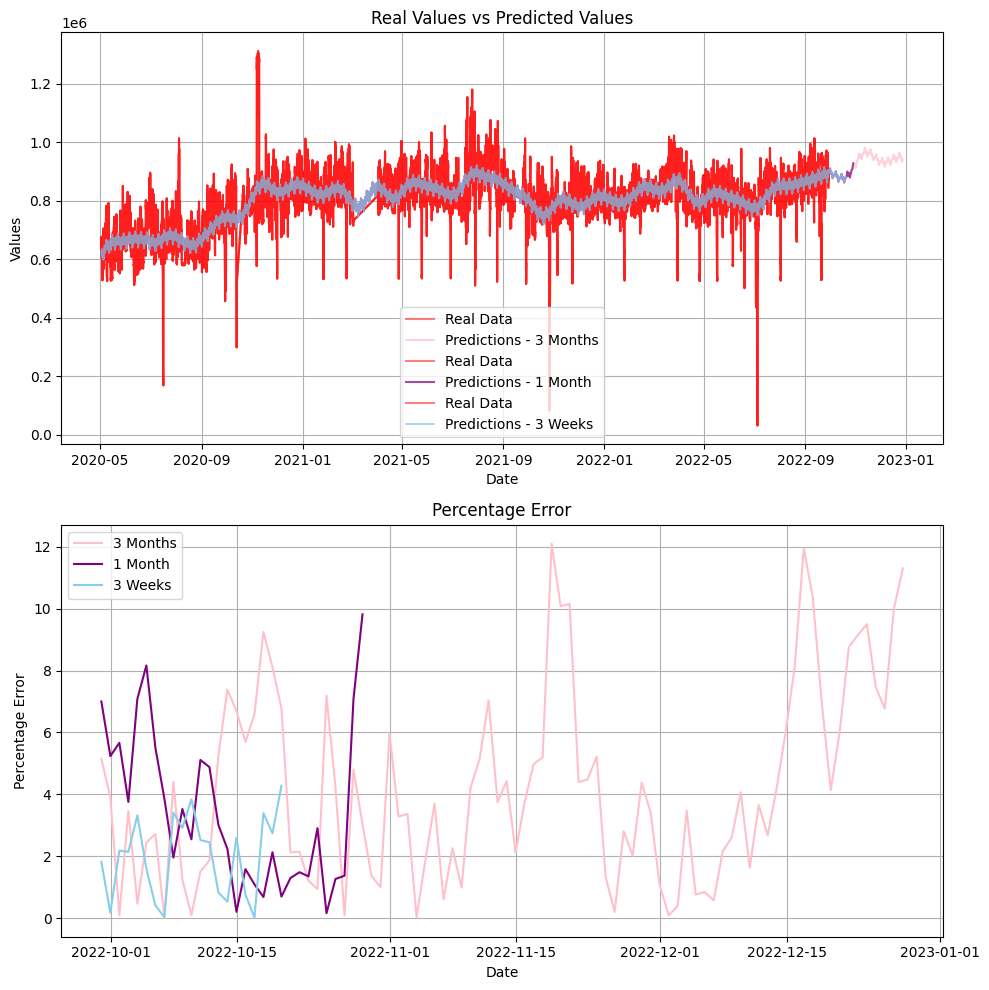

In [158]:
# Initialize subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Define colors for each period
colors = ['pink', 'purple', 'skyblue']

# Loop over periods to generate predictions and plot forecasts
for periods, label, color in zip(new_periods_list, new_periods_labels, colors):
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Define data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Compute absolute percentage error
    absolute_percentage_error = abs((dataset_P['y'].tail(periods).values - forecast['yhat'].tail(periods).values) / dataset_P['y'].tail(periods).values) * 100
    
    # Compute mean absolute percentage error
    mean_absolute_percentage_error = absolute_percentage_error.mean()
    
    print(f'Mean Absolute Percentage Error for {label}: {mean_absolute_percentage_error:.2f}%')
    
    # Plot real values vs predicted values in the first subplot
    axs[0].plot(x1, y1, 'r-', label='Real Data', alpha=0.5)
    axs[0].plot(x2, y2, label=f'Predictions - {label}', color=color, alpha=0.7)
    axs[0].set_title('Real Values vs Predicted Values')
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Values')
    axs[0].legend()
    
    # Plot percentage error in the second subplot
    axs[1].plot(x2.tail(periods), absolute_percentage_error, label=label, color=color)
    axs[1].set_title('Percentage Error')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Percentage Error')
    axs[1].legend()

# Add grid lines to both subplots
    axs[0].grid(True)
    axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

<font color='pink'>**Results**:</color> 
<font color='white'>The plot shows that predicting on a **smaller range** gives **less percentage error**</color> 


Mean Absolute Percentage Error for 2 Weeks: 2.40%
Mean Absolute Percentage Error for 1 Week: 3.13%


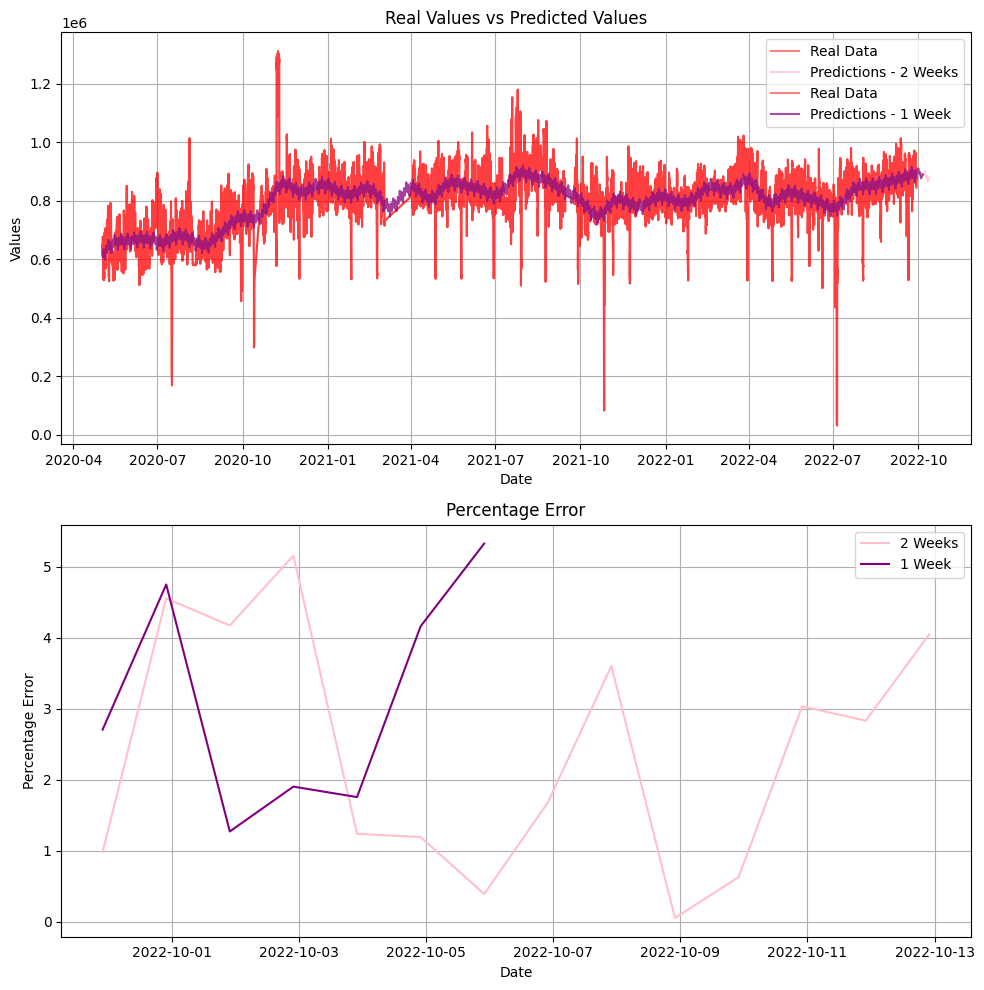

In [159]:

weeks_list = [14, 7]
weeks_labels = ['2 Weeks', '1 Week']
# Initialize subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 10))

# Define colors for each period
colors = ['pink', 'purple', 'skyblue']

# Loop over periods to generate predictions and plot forecasts
for periods, label, color in zip(weeks_list, weeks_labels, colors):
    # Generate future dataframe for the current period
    future = m.make_future_dataframe(periods=periods)
    
    # Make predictions
    forecast = m.predict(future)
    
    # Define data points for predictions
    x2 = forecast['ds']
    y2 = forecast['yhat']
    
    # Compute absolute percentage error
    absolute_percentage_error = abs((dataset_P['y'].tail(periods).values - forecast['yhat'].tail(periods).values) / dataset_P['y'].tail(periods).values) * 100
    
    # Compute mean absolute percentage error
    mean_absolute_percentage_error = absolute_percentage_error.mean()
    
    print(f'Mean Absolute Percentage Error for {label}: {mean_absolute_percentage_error:.2f}%')
    
    # Plot real values vs predicted values in the first subplot
    axs[0].plot(x1, y1, 'r-', label='Real Data', alpha=0.5)
    axs[0].plot(x2, y2, label=f'Predictions - {label}', color=color, alpha=0.7)
    axs[0].set_title('Real Values vs Predicted Values')
    axs[0].set_xlabel('Date')
    axs[0].set_ylabel('Values')
    axs[0].legend()
    
    # Plot percentage error in the second subplot
    axs[1].plot(x2.tail(periods), absolute_percentage_error, label=label, color=color)
    axs[1].set_title('Percentage Error')
    axs[1].set_xlabel('Date')
    axs[1].set_ylabel('Percentage Error')
    axs[1].legend()

# Add grid lines to both subplots
    axs[0].grid(True)
    axs[1].grid(True)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

Summarizing the predictions
- Mean Absolute Percentage Error for **3 Months: 4.22%**
- Mean Absolute Percentage Error for **1 Month: 3.42%**
- Mean Absolute Percentage Error for **3 Weeks: 2.00%**
- Mean Absolute Percentage Error for **2 Weeks: 2.40%**
- Mean Absolute Percentage Error for **1 Week: 3.13%**

It's evident that the **optimal prediction period**  for achieving **optimal performance** is **3 Weeks**, with a Mean Absolute Percentage Error of 2.00%. This period demonstrates the <font color='red'>lowest error rate</color> <font color='white'>among the options considered.</color>